<h2 align='center' style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Project Goal
    <a href='https://www.kaggle.com/c/prudential-life-insurance-assessment/overview' style='font-size: smaller;'>[link]</a>
</h2>

> The goal of this project is to develop a predictive model for Prudential Life Insurance (Kaggle dataset) that accurately categorizes risks into eight distinct classes, thereby improving the accuracy of risk assessment and reducing the time to get insurance quote.

> To apply machine learning algorithms to analyze datasets to identify complex patterns and predict insurance risk more accurately. Also to use clustering algorithms to segment customers to tailor products and services to individual needs.

<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Import Libraries
</h2>

In [1]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, roc_curve, make_scorer
from sklearn.feature_selection import SelectKBest, mutual_info_classif, VarianceThreshold
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.preprocessing import KBinsDiscretizer, LabelEncoder, OneHotEncoder
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from lime.lime_tabular import LimeTabularExplainer
from sklearn.neural_network import MLPClassifier
from scikitplot.cluster import plot_elbow_curve
from scikitplot.metrics import plot_silhouette
from tensorflow.keras.models import Sequential
from imblearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from catboost import CatBoostClassifier
from imblearn.combine import SMOTEENN
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import tensorflow as tf
import xgboost as xgb
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
import logging
import shap


warnings.filterwarnings('ignore')
tf.get_logger().setLevel(logging.ERROR)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Load Data
</h2>

> The test and train data are stored in distinct .csv files. They will be loaded and processed autonomously and concurrently, ensuring that both undergo the same transformation process as any new data in a production environment. This ensures consistency and fairness in the treatment of the data, allowing for reliable evaluation of model performance and generalization to unseen data.

In [2]:
# train data
zip_file_path = r'prudential-life-insurance-assessment\train.csv.zip'
train_df = pd.read_csv(zip_file_path, compression='zip', header=0)
train_df.head(1)

,Id,Product_Info_1,Product_Info_2,Product_Info_3,Product_Info_4,Product_Info_5,Product_Info_6,Product_Info_7,Ins_Age,Ht,Wt,BMI,Employment_Info_1,Employment_Info_2,Employment_Info_3,Employment_Info_4,Employment_Info_5,Employment_Info_6,InsuredInfo_1,InsuredInfo_2,InsuredInfo_3,InsuredInfo_4,InsuredInfo_5,InsuredInfo_6,InsuredInfo_7,Insurance_History_1,Insurance_History_2,Insurance_History_3,Insurance_History_4,Insurance_History_5,Insurance_History_7,Insurance_History_8,Insurance_History_9,Family_Hist_1,Family_Hist_2,Family_Hist_3,Family_Hist_4,Family_Hist_5,Medical_History_1,Medical_History_2,Medical_History_3,Medical_History_4,Medical_History_5,Medical_History_6,Medical_History_7,Medical_History_8,Medical_History_9,Medical_History_10,Medical_History_11,Medical_History_12,Medical_History_13,Medical_History_14,Medical_History_15,Medical_History_16,Medical_History_17,Medical_History_18,Medical_History_19,Medical_History_20,Medical_History_21,Medical_History_22,Medical_History_23,Medical_History_24,Medical_History_25,Medical_History_26,Medical_History_27,Medical_History_28,Medical_History_29,Medical_History_30,Medical_History_31,Medical_History_32,Medical_History_33,Medical_History_34,Medical_History_35,Medical_History_36,Medical_History_37,Medical_History_38,Medical_History_39,Medical_History_40,Medical_History_41,Medical_Keyword_1,Medical_Keyword_2,Medical_Keyword_3,Medical_Keyword_4,Medical_Keyword_5,Medical_Keyword_6,Medical_Keyword_7,Medical_Keyword_8,Medical_Keyword_9,Medical_Keyword_10,Medical_Keyword_11,Medical_Keyword_12,Medical_Keyword_13,Medical_Keyword_14,Medical_Keyword_15,Medical_Keyword_16,Medical_Keyword_17,Medical_Keyword_18,Medical_Keyword_19,Medical_Keyword_20,Medical_Keyword_21,Medical_Keyword_22,Medical_Keyword_23,Medical_Keyword_24,Medical_Keyword_25,Medical_Keyword_26,Medical_Keyword_27,Medical_Keyword_28,Medical_Keyword_29,Medical_Keyword_30,Medical_Keyword_31,Medical_Keyword_32,Medical_Keyword_33,Medical_Keyword_34,Medical_Keyword_35,Medical_Keyword_36,Medical_Keyword_37,Medical_Keyword_38,Medical_Keyword_39,Medical_Keyword_40,Medical_Keyword_41,Medical_Keyword_42,Medical_Keyword_43,Medical_Keyword_44,Medical_Keyword_45,Medical_Keyword_46,Medical_Keyword_47,Medical_Keyword_48,Response
0,2,1,D3,10,0.076923,2,1,1,0.641791,0.581818,0.148536,0.323008,0.028,12,1,0.0,3,NaN,1,2,6,3,1,2,1,1,1,3,1,0.000667,1,1,2,2,NaN,0.598039,NaN,0.526786,4.0,112,2,1,1,3,2,2,1,NaN,3,2,3,3,240.0,3,3,1,1,2,1,2,3,NaN,1,3,3,1,3,2,3,NaN,1,3,1,2,2,1,3,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8


In [3]:
# test data
zip_file_path = r'prudential-life-insurance-assessment\test.csv.zip'
test_df = pd.read_csv(zip_file_path, compression='zip', header=0)
test_df.head(1)

,Id,Product_Info_1,Product_Info_2,Product_Info_3,Product_Info_4,Product_Info_5,Product_Info_6,Product_Info_7,Ins_Age,Ht,Wt,BMI,Employment_Info_1,Employment_Info_2,Employment_Info_3,Employment_Info_4,Employment_Info_5,Employment_Info_6,InsuredInfo_1,InsuredInfo_2,InsuredInfo_3,InsuredInfo_4,InsuredInfo_5,InsuredInfo_6,InsuredInfo_7,Insurance_History_1,Insurance_History_2,Insurance_History_3,Insurance_History_4,Insurance_History_5,Insurance_History_7,Insurance_History_8,Insurance_History_9,Family_Hist_1,Family_Hist_2,Family_Hist_3,Family_Hist_4,Family_Hist_5,Medical_History_1,Medical_History_2,Medical_History_3,Medical_History_4,Medical_History_5,Medical_History_6,Medical_History_7,Medical_History_8,Medical_History_9,Medical_History_10,Medical_History_11,Medical_History_12,Medical_History_13,Medical_History_14,Medical_History_15,Medical_History_16,Medical_History_17,Medical_History_18,Medical_History_19,Medical_History_20,Medical_History_21,Medical_History_22,Medical_History_23,Medical_History_24,Medical_History_25,Medical_History_26,Medical_History_27,Medical_History_28,Medical_History_29,Medical_History_30,Medical_History_31,Medical_History_32,Medical_History_33,Medical_History_34,Medical_History_35,Medical_History_36,Medical_History_37,Medical_History_38,Medical_History_39,Medical_History_40,Medical_History_41,Medical_Keyword_1,Medical_Keyword_2,Medical_Keyword_3,Medical_Keyword_4,Medical_Keyword_5,Medical_Keyword_6,Medical_Keyword_7,Medical_Keyword_8,Medical_Keyword_9,Medical_Keyword_10,Medical_Keyword_11,Medical_Keyword_12,Medical_Keyword_13,Medical_Keyword_14,Medical_Keyword_15,Medical_Keyword_16,Medical_Keyword_17,Medical_Keyword_18,Medical_Keyword_19,Medical_Keyword_20,Medical_Keyword_21,Medical_Keyword_22,Medical_Keyword_23,Medical_Keyword_24,Medical_Keyword_25,Medical_Keyword_26,Medical_Keyword_27,Medical_Keyword_28,Medical_Keyword_29,Medical_Keyword_30,Medical_Keyword_31,Medical_Keyword_32,Medical_Keyword_33,Medical_Keyword_34,Medical_Keyword_35,Medical_Keyword_36,Medical_Keyword_37,Medical_Keyword_38,Medical_Keyword_39,Medical_Keyword_40,Medical_Keyword_41,Medical_Keyword_42,Medical_Keyword_43,Medical_Keyword_44,Medical_Keyword_45,Medical_Keyword_46,Medical_Keyword_47,Medical_Keyword_48
0,1,1,D3,26,0.487179,2,3,1,0.61194,0.781818,0.338912,0.472262,0.15,3,1,0.0,2,0.5,2,2,11,3,1,1,1,2,1,1,3,NaN,3,2,3,3,NaN,0.627451,0.760563,NaN,2.0,16,2,2,1,3,1,2,2,NaN,3,2,1,3,NaN,1,2,1,1,2,1,2,1,NaN,2,2,1,1,3,2,3,NaN,3,3,1,3,2,1,3,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [4]:
# preview data shape
print('Training Data:', train_df.shape, '\nTesting Data:', test_df.shape)

Training Data: (59381, 128) 
Testing Data: (19765, 127)


<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Data Cleaning
</h2>

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        1. Convert text to lower case  and remove extra spaces
    </i></strong>
</h2>

In [5]:
#1a. function to convert texts to lowercases and strip extra spaces
def process_text(value):
    if isinstance(value, str):
        return value.lower().strip()
    else:
        return value

In [6]:
#1b. apply the function to each element in both csv
train_df = train_df.map(process_text)
test_df = test_df.map(process_text)

In [7]:
#1c. preview sample data
train_df.sample(1)

,Id,Product_Info_1,Product_Info_2,Product_Info_3,Product_Info_4,Product_Info_5,Product_Info_6,Product_Info_7,Ins_Age,Ht,Wt,BMI,Employment_Info_1,Employment_Info_2,Employment_Info_3,Employment_Info_4,Employment_Info_5,Employment_Info_6,InsuredInfo_1,InsuredInfo_2,InsuredInfo_3,InsuredInfo_4,InsuredInfo_5,InsuredInfo_6,InsuredInfo_7,Insurance_History_1,Insurance_History_2,Insurance_History_3,Insurance_History_4,Insurance_History_5,Insurance_History_7,Insurance_History_8,Insurance_History_9,Family_Hist_1,Family_Hist_2,Family_Hist_3,Family_Hist_4,Family_Hist_5,Medical_History_1,Medical_History_2,Medical_History_3,Medical_History_4,Medical_History_5,Medical_History_6,Medical_History_7,Medical_History_8,Medical_History_9,Medical_History_10,Medical_History_11,Medical_History_12,Medical_History_13,Medical_History_14,Medical_History_15,Medical_History_16,Medical_History_17,Medical_History_18,Medical_History_19,Medical_History_20,Medical_History_21,Medical_History_22,Medical_History_23,Medical_History_24,Medical_History_25,Medical_History_26,Medical_History_27,Medical_History_28,Medical_History_29,Medical_History_30,Medical_History_31,Medical_History_32,Medical_History_33,Medical_History_34,Medical_History_35,Medical_History_36,Medical_History_37,Medical_History_38,Medical_History_39,Medical_History_40,Medical_History_41,Medical_Keyword_1,Medical_Keyword_2,Medical_Keyword_3,Medical_Keyword_4,Medical_Keyword_5,Medical_Keyword_6,Medical_Keyword_7,Medical_Keyword_8,Medical_Keyword_9,Medical_Keyword_10,Medical_Keyword_11,Medical_Keyword_12,Medical_Keyword_13,Medical_Keyword_14,Medical_Keyword_15,Medical_Keyword_16,Medical_Keyword_17,Medical_Keyword_18,Medical_Keyword_19,Medical_Keyword_20,Medical_Keyword_21,Medical_Keyword_22,Medical_Keyword_23,Medical_Keyword_24,Medical_Keyword_25,Medical_Keyword_26,Medical_Keyword_27,Medical_Keyword_28,Medical_Keyword_29,Medical_Keyword_30,Medical_Keyword_31,Medical_Keyword_32,Medical_Keyword_33,Medical_Keyword_34,Medical_Keyword_35,Medical_Keyword_36,Medical_Keyword_37,Medical_Keyword_38,Medical_Keyword_39,Medical_Keyword_40,Medical_Keyword_41,Medical_Keyword_42,Medical_Keyword_43,Medical_Keyword_44,Medical_Keyword_45,Medical_Keyword_46,Medical_Keyword_47,Medical_Keyword_48,Response
16970,22621,1,d4,26,1.0,2,3,1,0.462687,0.690909,0.276151,0.462452,0.08,12,1,0.0,2,0.5,1,2,3,3,1,2,1,1,1,3,1,0.003333,1,1,2,2,NaN,NaN,NaN,0.151786,15.0,132,2,2,1,3,2,2,2,NaN,3,2,3,3,NaN,1,3,1,1,2,1,2,3,NaN,1,3,3,1,3,2,3,NaN,3,3,1,2,2,1,3,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        2. Remove duplicated rows and empty rows/columns
    </i></strong>
</h2>

In [8]:
#2a. remove duplicate rows based on all columns and reset the index to ensure a clean and continuous integer index

sh1 = train_df.shape
# remove duplicate rows in train dataset
train_df = train_df.drop_duplicates()

# reset the index
train_df = train_df.reset_index(drop=True)

sh2 = train_df.shape
print(f'shape_before: {sh1}, \n shape_after: {sh2}')

shape_before: (59381, 128), 
 shape_after: (59381, 128)


In [9]:
#2b. check if any column has all values as None (NaN) and delete the identified columns if any

sh1 = train_df.shape
# check column for NaN values
columns_to_delete = train_df.columns[train_df.isnull().all()]

# delete the identified columns in both csv
train_df = train_df.drop(columns=columns_to_delete)
test_df = test_df.drop(columns=columns_to_delete)

sh1 = train_df.shape
print(f'shape_before: {sh1}, \n shape_after: {sh2}')

shape_before: (59381, 128), 
 shape_after: (59381, 128)


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        3. Check for Missing Values
    </i></strong>
</h2>

In [10]:
#3a. function to summarize missing values in a df
def check_missing(df):
    '''
    This function checks for missing values in each column of a DataFrame and returns only those columns
    that have missing data, along with the total count and percentage of missing data.
    '''
    
    # calculate total missing values and percentage missing for each column
    total_missing = df.isnull().sum().sort_values(ascending=False)
    percentage = (df.isnull().mean() * 100).round(2).sort_values(ascending=False)
    
    # combine total missing values and percentage missing into a single DataFrame
    missing_data = pd.concat([total_missing, percentage], axis=1, keys=['TotalMissing', 'PercentMissing'])
    
    # filter out columns that have no missing data
    missing_data = missing_data[missing_data['TotalMissing'] > 0]
    
    return missing_data

In [11]:
#3b. show missing value information
missing_value_columns1 = check_missing(train_df)
print(missing_value_columns1)

                     TotalMissing  PercentMissing
Medical_History_10          58824           99.06
Medical_History_32          58274           98.14
Medical_History_24          55580           93.60
Medical_History_15          44596           75.10
Family_Hist_5               41811           70.41
Family_Hist_3               34241           57.66
Family_Hist_2               28656           48.26
Insurance_History_5         25396           42.77
Family_Hist_4               19184           32.31
Employment_Info_6           10854           18.28
Medical_History_1            8889           14.97
Employment_Info_4            6779           11.42
Employment_Info_1              19            0.03


In [12]:
#3c. drop columns with too many (>20 percent) missing values in both csv
## the presence of columns with more than 20% missing values presents challenges: 
## blindly imputing or deleting them risks introducing bias or reducing the effectiveness of the analysis or model,
## as the missing values may contain valuable information.

# drop miising values
train_df = train_df.dropna(axis=1, thresh=int(0.80*len(train_df)))
test_df = test_df.dropna(axis=1, thresh=int(0.80*len(test_df)))

# view missing values not deleted
missing_value_columns2 = check_missing(train_df)
print(missing_value_columns2)

                   TotalMissing  PercentMissing
Employment_Info_6         10854           18.28
Medical_History_1          8889           14.97
Employment_Info_4          6779           11.42
Employment_Info_1            19            0.03


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        4. Split Dataset to Avoid Data Leak
    </i></strong>
</h2>

> <strong> preventing data leakage
>> * the original data sets downloaded from kaggle website have seperate training and testing data
>> * the training data will be split into train and validation sets for the purpose of this project
>> * after evaluating the performance of selected algorithms, the model will be fitted to the whole training data and then we make prediction for kaggle test data
>> * therefore the split data set for this project is only for local evaluation; while the original test data from kaggle will be evaluated by uploading the results to kaggle
>> * the split is done to avoid data leakage and to create another set of data for local evaluation
>> * we have 2 sets of unseen data: test_df, and X_val

In [13]:
#4a. separate X and y variables from original train data set

X = train_df.drop(columns='Response')
y = train_df['Response']

In [14]:
#4b. split the train dataset with stratify*

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20, random_state=1, stratify=y)
print(f'X_train shape: {X_train.shape}, X_val shape: {X_val.shape}, y_train shape: {y_train.shape}, y_val shape: {y_val.shape}')

X_train shape: (47504, 118), X_val shape: (11877, 118), y_train shape: (47504,), y_val shape: (11877,)


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        4. Fix the Missing Values
    </i></strong>
</h2>

> <strong> consideration
>> * determine best replacement for missing values based on data distribution
>> * for skewed, use median; for normal distribution, use mean; for multimodal, use knn; for categorical, use mode
>> * we only examine the X_train data, assuming that X_val and test_df are unseen

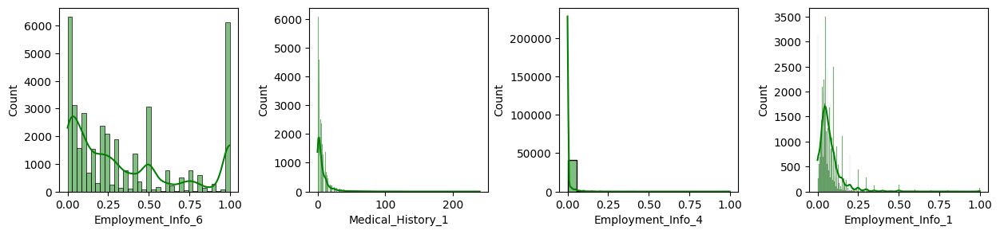

In [15]:
#4a. check the distributions of missing values to be fixed

# create a figure and axis
fig, ax = plt.subplots(1, 4, figsize=(15, 3))

# plot the distribution of each column using a histogram
sns.histplot(X_train['Employment_Info_6'], kde=True, color='green', ax=ax[0])
sns.histplot(X_train['Medical_History_1'], kde=True, color='green', ax=ax[1])
sns.histplot(X_train['Employment_Info_4'], kde=True, color='green', ax=ax[2])
sns.histplot(X_train['Employment_Info_1'], kde=True, color='green', ax=ax[3])

# adjust spacing between subplots
plt.subplots_adjust(wspace=0.4);

In [16]:
#4bi. fill missing values in 'Employment_Info_6' using KNN Imputer

# initialize KNNImputer
imp_knn1 = KNNImputer(n_neighbors=2)

# fit on train set and transform both train and test set
X_train['Employment_Info_6'] = imp_knn1.fit_transform(X_train[['Employment_Info_6']])
X_val['Employment_Info_6'] = imp_knn1.transform(X_val[['Employment_Info_6']])
test_df['Employment_Info_6'] = imp_knn1.transform(test_df[['Employment_Info_6']])

In [17]:
#4bii. fill missing values in 'Medical_History_1' with MEDIAN using simple imputer

# initialize SimpleImputer
imp_median1 = SimpleImputer(missing_values=pd.NA, strategy='median')

# fit on train set and transform both train and test set
X_train['Medical_History_1'] = imp_median1.fit_transform(X_train[['Medical_History_1']])
X_val['Medical_History_1'] = imp_median1.transform(X_val[['Medical_History_1']])
test_df['Medical_History_1'] = imp_median1.transform(test_df[['Medical_History_1']])

In [18]:
#4biii. fill missing values in 'Employment_Info_4' with MEDIAN using simple imputer

# initialize SimpleImputer
imp_median2 = SimpleImputer(missing_values=pd.NA, strategy='median')

# fit on train set and transform both train and test set
X_train['Employment_Info_4'] = imp_median2.fit_transform(X_train[['Employment_Info_4']])
X_val['Employment_Info_4'] = imp_median2.transform(X_val[['Employment_Info_4']])
test_df['Employment_Info_4'] = imp_median2.transform(test_df[['Employment_Info_4']])

In [19]:
#4biv. fill missing values in 'Employment_Info_1' with MEDIAN using simple imputer

# initialize SimpleImputer
imp_median3 = SimpleImputer(missing_values=pd.NA, strategy='median')

# fit on train set and transform both train and test set
X_train['Employment_Info_1'] = imp_median3.fit_transform(X_train[['Employment_Info_1']])
X_val['Employment_Info_1'] = imp_median3.transform(X_val[['Employment_Info_1']])
test_df['Employment_Info_1'] = imp_median3.transform(test_df[['Employment_Info_1']])

In [20]:
#4c. check if there are no more missing values
missing_value_Xtrain = check_missing(X_train)
missing_value_Xval = check_missing(X_train)
missing_value_traindf = check_missing(X_train)
print(missing_value_Xtrain, missing_value_Xval, missing_value_traindf)

Empty DataFrame
Columns: [TotalMissing, PercentMissing]
Index: [] Empty DataFrame
Columns: [TotalMissing, PercentMissing]
Index: [] Empty DataFrame
Columns: [TotalMissing, PercentMissing]
Index: []


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        5. Remove Irrelevant Column(s)
    </i></strong>
</h2>

In [21]:
# drop the 'ID' column
X_train = X_train.drop(columns='Id')
X_val = X_val.drop(columns='Id')
test_df = test_df.drop(columns='Id')

# preview data shape
print('X_train Data:', X_train.shape, '\nX_val Data:', X_val.shape, '\nTesting Data:', test_df.shape)

X_train Data: (47504, 117) 
X_val Data: (11877, 117) 
Testing Data: (19765, 117)


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        6. Reduce Memory Usage
    </i></strong>
</h2>

In [22]:
#6a. function that counts and lists the number of unique values in each column of a df, and display the data type for each column
def generate_column_summary(df, num_examples=3):
    '''
    Generate a summary DataFrame with information about each column in the input DataFrame.
    Parameters:
    - df (pd.DataFrame): Input DataFrame.
    - num_examples (int): Number of unique examples to show for each column.
    Returns:
    - pd.DataFrame: Summary DataFrame containing columns:
        - 'Column Name': Name of each column.
        - 'Data Type': Data type of each column.
        - 'Unique Values': Total number of unique values in each column.
        - 'Examples': Unique examples for each column as a list of tuples.
    '''
    # Initialize an empty DataFrame
    summary_df = pd.DataFrame(columns=['Column_Name', 'Unique_Count', 'Data_Type', 'Examples'])

    # Iterate through each column in the input DataFrame
    for column in df.columns:
        # Get data type of the column
        data_type = df[column].dtype

        # Get the total number of unique values in the column
        num_unique_values = df[column].nunique()

        # Get unique examples from the column as a list
        unique_examples = df[column].unique()[:num_examples]

        # Append the new information for each column
        summary_df = pd.concat([summary_df, pd.DataFrame({
            'Column_Name': [column],
            'Unique_Count': [num_unique_values],
            'Data_Type': [data_type],
            'Examples': [list(unique_examples)]
        })], ignore_index=True)
        
    return summary_df

In [23]:
#6b. see results of unique values in train_df with example
summary_df = generate_column_summary(X_train, num_examples=2)
print(summary_df)

             Column_Name Unique_Count Data_Type                    Examples
0         Product_Info_1            2     int64                      [1, 2]
1         Product_Info_2           19    object                    [d3, a6]
2         Product_Info_3           32     int64                    [29, 26]
3         Product_Info_4         1241   float64  [0.487179487, 0.076923077]
4         Product_Info_5            2     int64                      [2, 3]
5         Product_Info_6            2     int64                      [3, 1]
6         Product_Info_7            3     int64                      [1, 3]
7                Ins_Age           65   float64  [0.388059701, 0.641791045]
8                     Ht           37   float64  [0.854545455, 0.672727273]
9                     Wt          299   float64  [0.345188285, 0.240585774]
10                   BMI         3110   float64  [0.413882041, 0.417276097]
11     Employment_Info_1         1665   float64              [0.0, 0.04004]
12     Emplo

In [24]:
#6c. ensure that the DataFrames are not using excessive memory by converting columns to more memory-efficient data types

# convert float64 columns to float32
float64_cols = X_train.select_dtypes(include=['float64']).columns
X_train[float64_cols] = X_train[float64_cols].astype('float32')
X_val[float64_cols] = X_val[float64_cols].astype('float32')
test_df[float64_cols] = test_df[float64_cols].astype('float32')

# convert int64 columns to int32
int64_cols = X_train.select_dtypes(include=['int64']).columns
X_train[int64_cols] = X_train[int64_cols].astype('int32')
X_val[int64_cols] = X_val[int64_cols].astype('int32')
test_df[int64_cols] = test_df[int64_cols].astype('int32')

#convert object columns to categorical
obj_cols = X_train.select_dtypes(include=['object']).columns
X_train[obj_cols] = X_train[obj_cols].astype('category')
X_val[obj_cols] = X_val[obj_cols].astype('category')
test_df[obj_cols] = test_df[obj_cols].astype('category')

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        7. Adjust Column Range of the Target Variable
    </i></strong>
</h2>

In [25]:
#7a. shift the range of 'Response' column from 1-8 to 0-7
## this operation must be performed once to avoid shifting towards negative values

# check if the operation has already been performed
if not 'adjustment_done' in globals():
    # subtract 1 from the 'Response' column
    y_train -= 1
    y_val -= 1
    # set the flag to indicate that the operation has been performed
    adjustment_done = True
else:
    print('The operation has already been performed.')

# convert Response to categorical variable
y_train = y_train.astype('category')
y_val = y_val.astype('category')
y_train.unique()

[5, 7, 4, 1, 0, 6, 3, 2]
Categories (8, int64): [0, 1, 2, 3, 4, 5, 6, 7]

<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Data Analysis
</h2>

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        1. Categorical to Numerical Conversion
    </i></strong>
</h2>

In [26]:
#1a make a copy of X_train, y_train for analysis
## to explore the insurance dataset, a copy of the training data is made so that the original dataset is untouched

X_eda = X_train.copy()
y_eda = y_train.copy()

In [27]:
#1b. for the purpose of analysis, convert the categorical dtype (Product_Info_2) to numerical using label encoder
## product_Info_2 is the only categorical data in the df

# convert to numeric using encoding technique
enc_cat1 = LabelEncoder()
X_eda['Product_Info_2'] = enc_cat1.fit_transform(X_eda['Product_Info_2'])

# view unique values in Product_Info_2 before encoding
cat_1 = list(enc_cat1.classes_)
print(f'unique category before encoding:\n {cat_1}\n')

# view unique values in Product_Info_2 after encoding
cat_2 = X_eda['Product_Info_2'].unique().tolist()
print(f'unique category after encoding:\n {sorted(cat_2)}')

# # to transform the column back to its original form after analysis use:
# X_eda['Product_Info_2'] = enc_cat1.inverse_transform(X_eda['Product_Info_2'])

unique category before encoding:
 ['a1', 'a2', 'a3', 'a4', 'a5', 'a6', 'a7', 'a8', 'b1', 'b2', 'c1', 'c2', 'c3', 'c4', 'd1', 'd2', 'd3', 'd4', 'e1']

unique category after encoding:
 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        2. Feature Description
    </i></strong>
</h2>

<font size='2'>

- **Id**: a unique identifier for an application.
- **Product_Info_1-7**: normalized variables for the applied product.
- **Ins_Age**: normalized applicant age.
- **Ht**: normalized applicant height.
- **Wt**: normalized applicant weight.
- **BMI**: normalized applicant body mass index.
- **Employment_Info_1-6**: normalized variables for applicant's employment history.
- **InsuredInfo_1-6**: normalized variables providing applicant information.
- **Insurance_History_1-9**: normalized variables for applicant's insurance history.
- **Family_Hist_1-5**: normalized variables for applicant's family history.
- **Medical_History_1-41**: normalized variables for applicant's medical history.
- **Medical_Keyword_1-48**: dummy variables indicating presence/absence of medical keywords associated with the application.
- **Response**: target variable indicating the final decision associated with an application.



Reference: [Prudential Life Insurance Assessment Dataset](https://www.kaggle.com/c/prudential-life-insurance-assessment/data)
</font>

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        3. Feature Selection for Analysis
    </i></strong>
</h2>

> <strong> notes
>> EDA analysis will focus on the key features that are likely to influence the prediction of the target variable.
To achieve this, Mutual Information (MI) Score will be used to rank the most influential features. 
Mutual Information between two random variables X and Y quantifies the amount of information about X that is captured by Y.
Features with higher mutual information scores are deemed to possess greater information about the target variable, making them more pertinent for predictive tasks.

In [28]:
#3ai. compute mutual information scores
## Features with higher mutual information values are considered more informative for predicting the target variable

# compute MI
mi_scores = mutual_info_classif(X_eda, y_eda)

# arrange the MI scores into a DataFrame
mi_df = pd.DataFrame({'Features': X_eda.columns, 'MI_scores': mi_scores})

# sort the df by IV
mi_sorted = mi_df.sort_values(by='MI_scores', ascending=False)

# select the top 10 features to analyse
top_ten = mi_sorted.head(10)

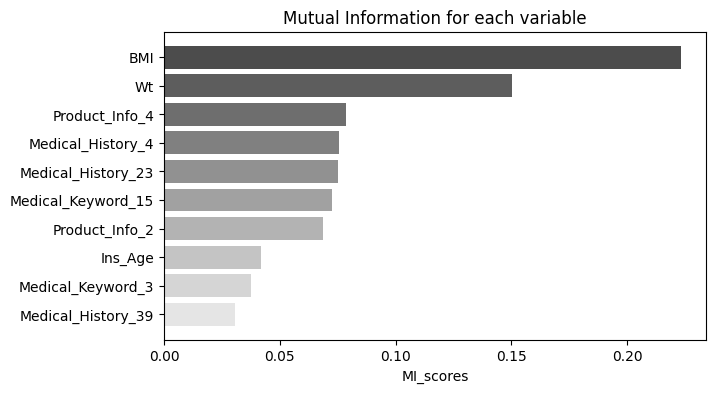

In [29]:
#3aii. visualize MI

# define shades of black with different levels of transparency (alpha)
colors = [(0, 0, 0, alpha) for alpha in np.linspace(0.7, 0.1, len(top_ten))]

# make the plot
plt.figure(figsize=(7, 4))
plt.barh(top_ten['Features'], top_ten['MI_scores'], color=colors)
plt.xlabel('MI_scores')
plt.title('Mutual Information for each variable')
plt.gca().invert_yaxis();

> <strong> summary
>> * the top 10 features that carry higher weights in predicting the target variable are selected using MI
>> * among the top features is the BMI which is calculated by dividing weight by the square of height
>> * since BMI depends on height and weight, the height will be included in the features selected for analysis
>> * the analysis will provide information about possible multicollinearity between BMI, Ht, and Wt
>> * these three variables will undergo further scrutiny to evaluate their impact on model interpretability, stability, feature selection, overfitting, and prediction error

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        4. Analysis of Feature Correlations
    </i></strong>
</h2>

In [30]:
#4ai. extract features for correlation analysis

# extract the top ten features
top_ten_df = X_eda[top_ten['Features'].to_list()]

# add height 'Ht' to the top 10
top_ten_df['Ht'] = X_eda['Ht']

In [31]:
#4aii. describe the selected features
top_ten_df.describe().round(3)

,BMI,Wt,Product_Info_4,Medical_History_4,Medical_History_23,Medical_Keyword_15,Product_Info_2,Ins_Age,Medical_Keyword_3,Medical_History_39,Ht
count,47504.000,47504.000,47504.000,47504.000,47504.000,47504.000,47504.000,47504.000,47504.000,47504.000,47504.000
mean,0.470,0.293,0.329,1.653,2.527,0.190,12.506,0.406,0.050,2.828,0.707
std,0.122,0.089,0.282,0.476,0.850,0.393,5.417,0.197,0.218,0.561,0.074
min,0.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000
25%,0.386,0.226,0.077,1.000,3.000,0.000,7.000,0.239,0.000,3.000,0.655
50%,0.452,0.289,0.231,2.000,3.000,0.000,15.000,0.403,0.000,3.000,0.709
75%,0.533,0.345,0.487,2.000,3.000,0.000,16.000,0.567,0.000,3.000,0.764
max,1.000,1.000,1.000,2.000,3.000,1.000,18.000,1.000,1.000,3.000,1.000


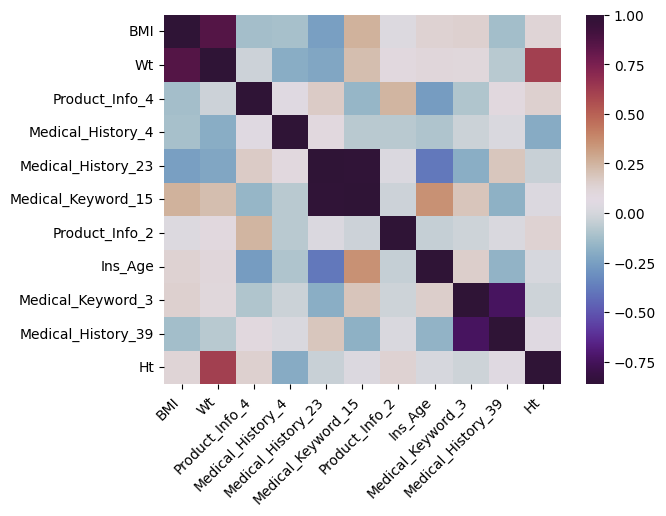

In [32]:
#4b. compute the correlation matrix and create heatmap for selected features

# calculate correlation matrix
corr = top_ten_df.corr()

# choose color palette
custom_palette = sns.color_palette('twilight_shifted', as_cmap=True)

# create heatmap using above color palette
ax = sns.heatmap(corr, cmap=custom_palette)

# adjust x-axis labels for better visibility
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right');

> <strong> multicollinearity
>> * high correlations between pairs of variables may indicate multicollinearity
>> * multicollinearity exists between BMI and weight, Medical_History_23 and Medical_Keyword_15
>> * the chart reveals that there is more correlation between weight and height than is in BMI and height

> <strong> note
>> * from domain knowledge, it is known that the correlation between BMI and Height is influenced by factors like age, gender, and body composition; thus, it's crucial to conduct a more comprehensive analysis of these variables

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        5. Analysis of Feature Interactions with target Response
    </i></strong>
</h2>

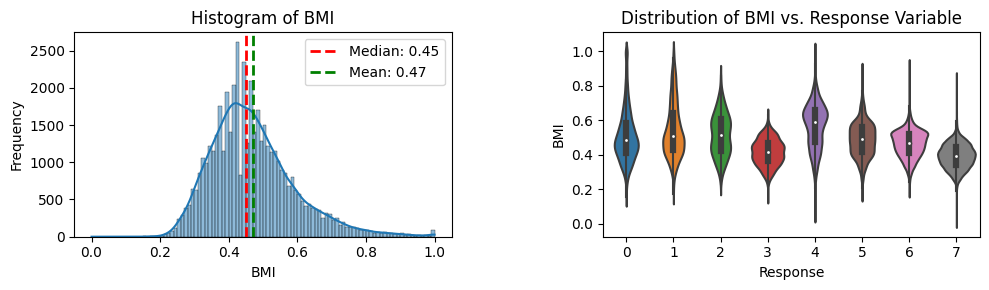

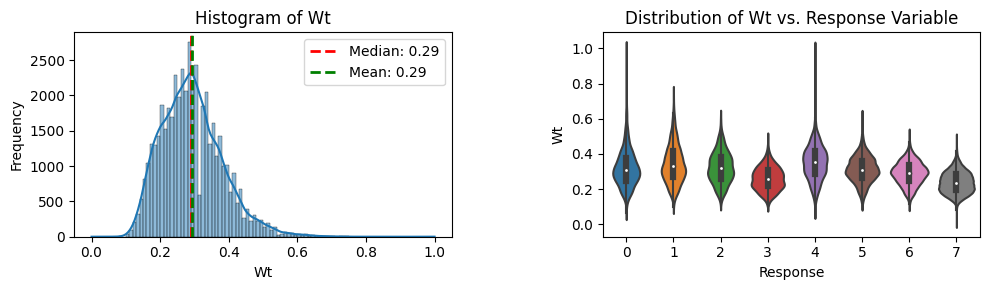

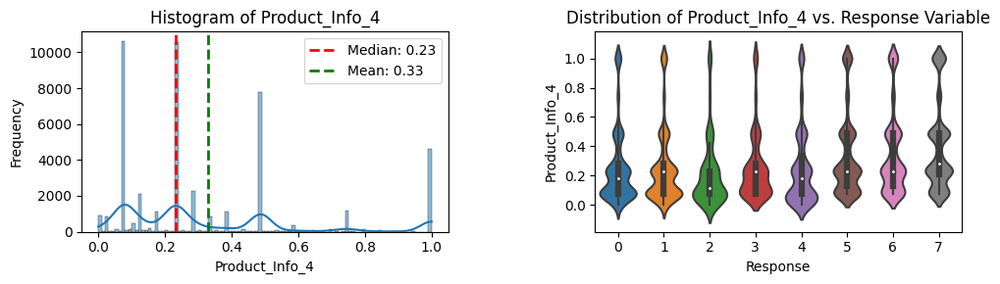

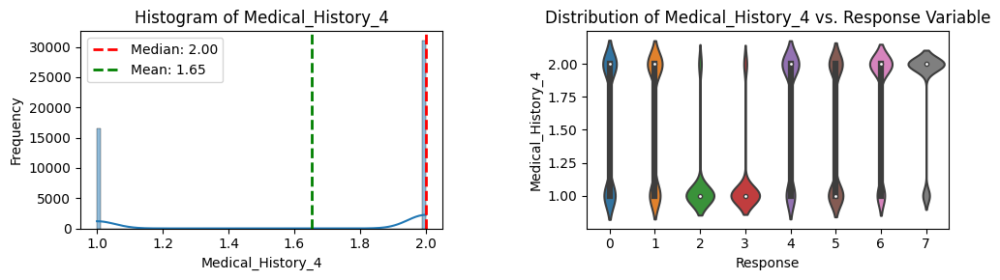

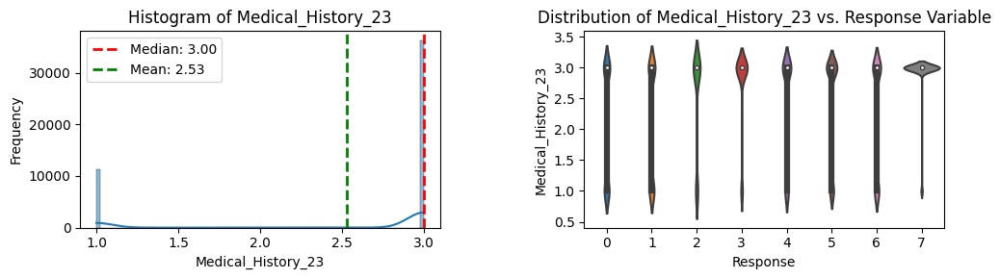

...

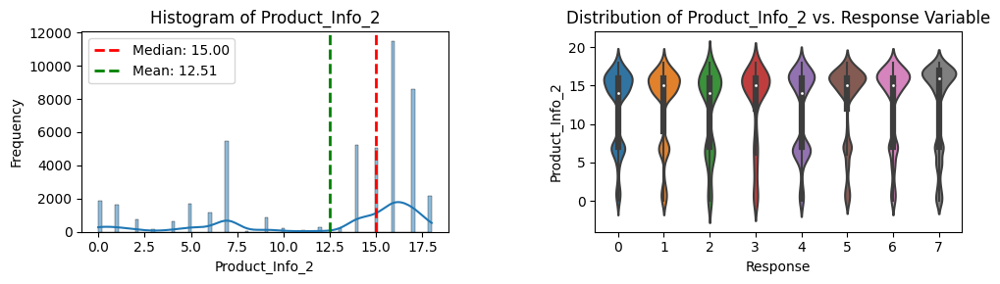

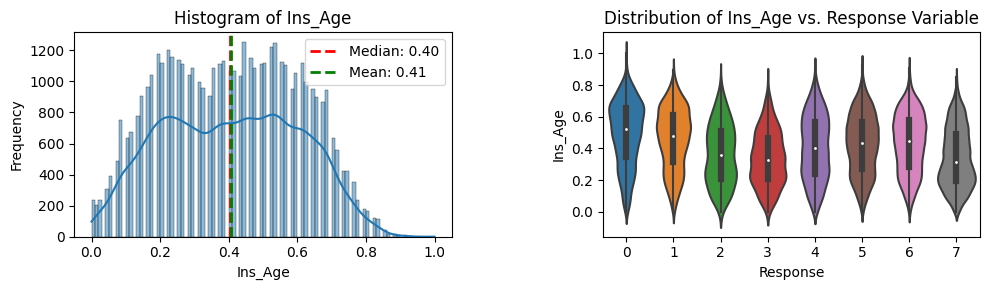

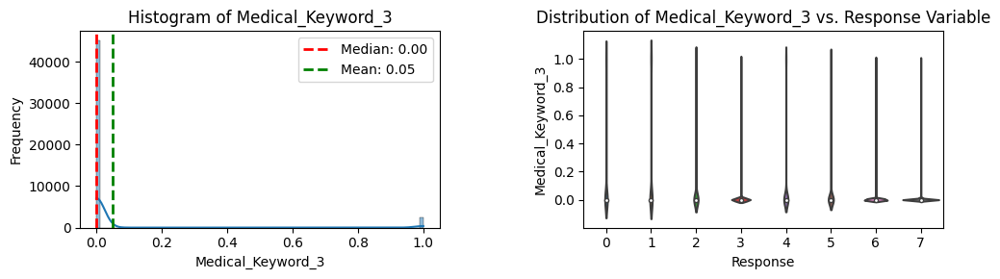

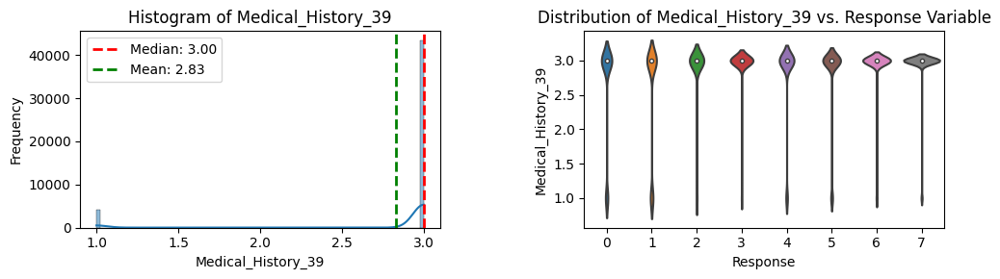

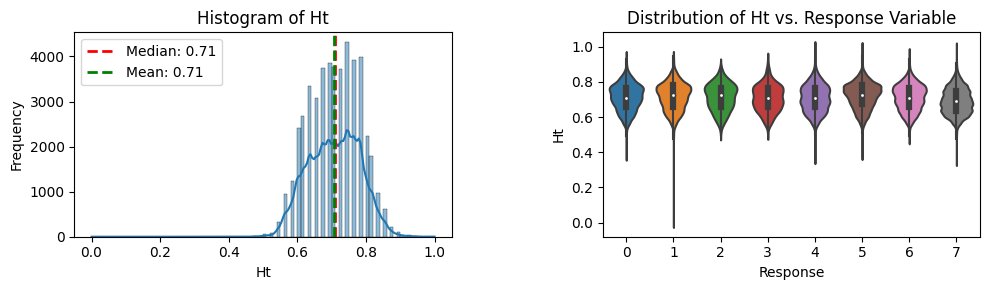

In [33]:
#5ai-xi. let's visualize the interaction between the top ten features and the target Response

# using histogram and violine plots
for i, col in enumerate(top_ten_df.columns):

    # compute mean and median
    median_value = np.median(top_ten_df[col])
    mean_value = np.mean(top_ten_df[col])

    # initialize figure
    fig, axes = plt.subplots(1, 2, figsize=(10, 3))
    
    # plot histogram
    sns.histplot(x=top_ten_df[col], bins=100, kde=True, ax=axes[0])
    axes[0].set_title(f'Histogram of {col}')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('Frequency')
    
    # annotate histogram plot with mean and median
    axes[0].axvline(x=median_value, color='r', linestyle='--', linewidth=2, label=f'Median: {median_value:.2f}')
    axes[0].axvline(x=mean_value, color='g', linestyle='--', linewidth=2, label=f'Mean: {mean_value:.2f}')
    axes[0].legend()

    # plot violin plot
    sns.violinplot(x=y_eda, y=top_ten_df[col], ax=axes[1])
    axes[1].set_title(f'Distribution of {col} vs. Response Variable')
    axes[1].set_xlabel('Response')
    axes[1].set_ylabel(col)
    
    # adjust layout
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.4)

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        6. Analysis of Interactions Between Features with Response Overlay
    </i></strong>
</h2>

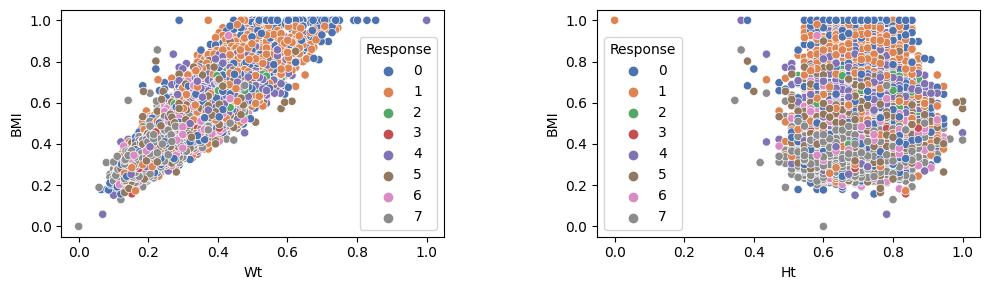

In [34]:
#6a. scatter plots of BMI vs. Ht and BMI vs. Ht with Response Variable Overlay 
## examine the correlation between BMI and weight and height

# create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 3))

sns.scatterplot(data=top_ten_df, x='Wt', y='BMI', hue=y_eda, ax=axes[0], palette='deep')
sns.scatterplot(data=top_ten_df, x='Ht', y='BMI', hue=y_eda, ax=axes[1], palette='deep')

# adjust layout
plt.tight_layout()
plt.subplots_adjust(wspace=0.4)

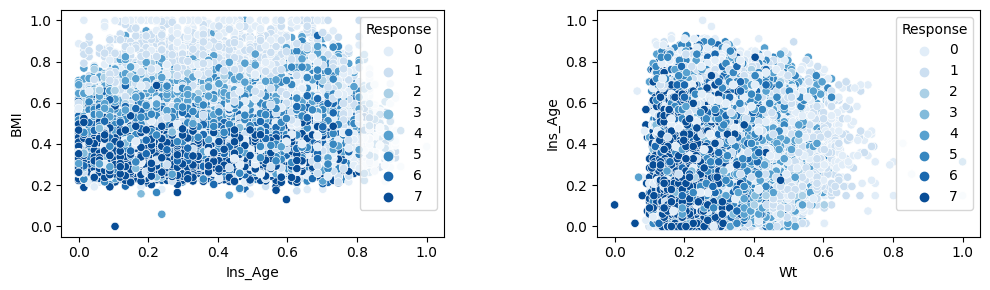

In [35]:
#6b. scatter plots of BMI vs. Ins_Age and Ins_Age vs. Wt with Response Variable Overlay
## examine the correlation between Age and BMI and Weight

# create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 3))
palettes = sns.color_palette('Blues', n_colors=len(y_eda.unique()))

sns.scatterplot(data=top_ten_df, x='Ins_Age', y='BMI', hue=y_eda, ax=axes[0], palette=palettes)
sns.scatterplot(data=top_ten_df, x='Wt', y='Ins_Age', hue=y_eda, ax=axes[1], palette=palettes)

# adjust layout
plt.tight_layout()
plt.subplots_adjust(wspace=0.4)

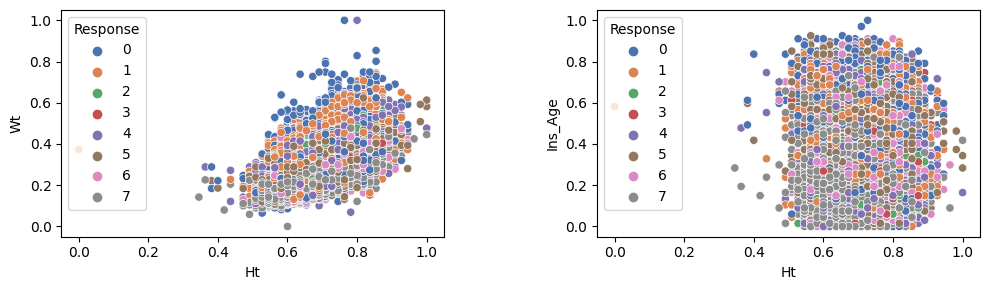

In [36]:
#6c. scatter plots of Ht vs. Wt and Ht vs. Ins_Age with Response Variable Overlay
## examine the correlation between Age and BMI and Weight

# create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 3))
palettes = sns.color_palette('Blues', n_colors=len(y_eda.unique()))

sns.scatterplot(data=top_ten_df, x='Ht', y='Wt', hue=y_eda, ax=axes[0], palette='deep')
sns.scatterplot(data=top_ten_df, x='Ht', y='Ins_Age', hue=y_eda, ax=axes[1], palette='deep')

# adjust layout
plt.tight_layout()
plt.subplots_adjust(wspace=0.4)

> <strong> correlation
>> * the scatter plots established that there are strong correlation between BMI and Weight, as well as Height and Weight
>> * they also suggest minimal correlation between Age and Weight, as well as BMI and Height
>> * based on the appearance of scatter plots, there seems to be no discernible correlation between Age and Height and Age and BMI

> <strong> note
>> <strong><i> the risk analysis and categorization of BMI, Age, and Weight presented below are adopted from:</i>
[Reference Link](https://www.kaggle.com/code/vignesh1609/prudential-life-insurance-eda#Target-Variable-Analysis)

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        7. Risk Analysis Base on BMI, Age, Weight, and Height
    </i></strong>
</h2>

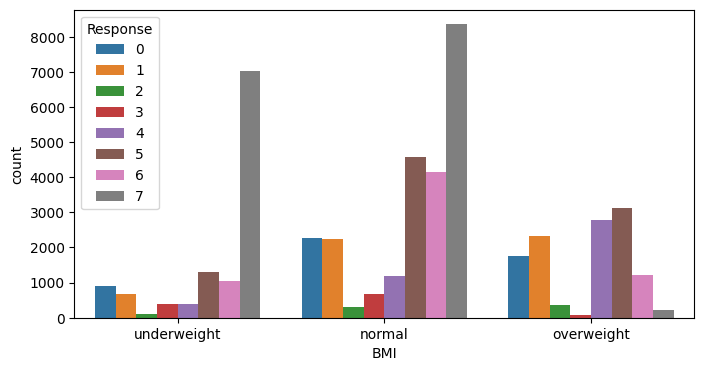

In [37]:
#7a. bin BMI into 3 groups and create a countplot Overlay with Response Variable 

# define categories for BMI classes
bmi_cat = ['underweight', 'normal', 'overweight']

# categorize BMI values into bins based on quartiles and assign labels
top_ten_df['BMI_cat'] = pd.qcut(top_ten_df['BMI'], q=[0, 0.25, 0.75, 1], labels=bmi_cat, duplicates='drop')

# create countplot
plt.figure(figsize=(8,4))
sns.countplot(x = 'BMI_cat', hue = y_eda, data = top_ten_df)
plt.xlabel('BMI');

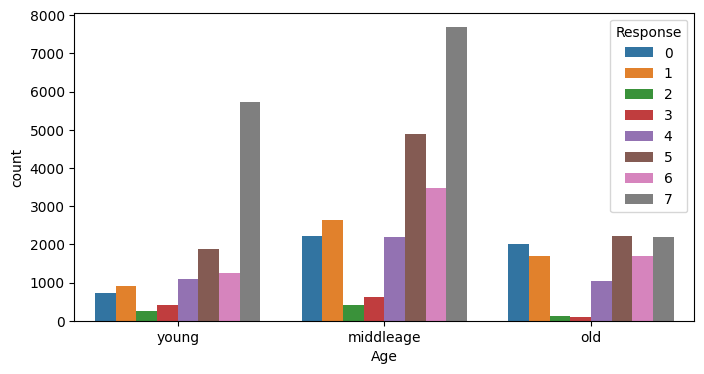

In [38]:
#7b. bin Age into 3 groups and create a countplot Overlay with Response Variable

# define categories for Age classes
age_cat = ['young', 'middleage', 'old']

# categorize Age values into bins based on quartiles and assign labels
top_ten_df['AGE_cat'] = pd.qcut(top_ten_df['Ins_Age'], q=[0, 0.25, 0.75, 1], labels=age_cat, duplicates='drop')

# create countplot
plt.figure(figsize=(8,4))
sns.countplot(x = 'AGE_cat', hue = y_eda, data = top_ten_df)
plt.xlabel('Age');

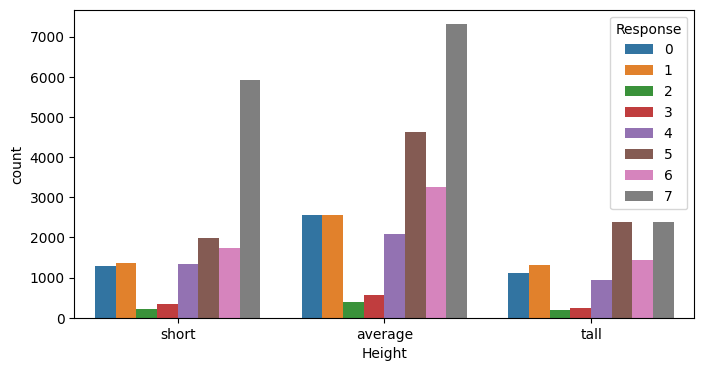

In [39]:
#7c. bin Height into 3 groups and create a countplot Overlay with Response Variable

# define categories for Height classes
ht_cat = ['short', 'average', 'tall']

# categorize Height values into bins based on quartiles and assign labels
top_ten_df['HT_cat'] = pd.qcut(top_ten_df['Ht'], q=[0, 0.25, 0.75, 1], labels=ht_cat, duplicates='drop')

# create countplot
plt.figure(figsize=(8,4))
sns.countplot(x = 'HT_cat', hue = y_eda, data = top_ten_df)
plt.xlabel('Height');

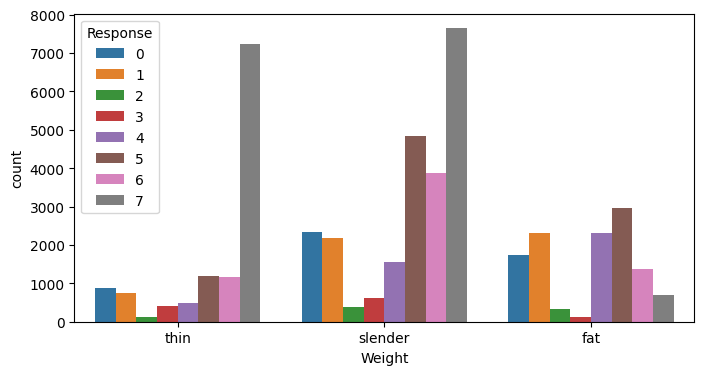

In [40]:
#7d. bin Weight into 3 groups  and create a countplot Overlay with Response Variable 

# define categories for Weight classes
wt_cat = ['thin', 'slender', 'fat']

# categorize Weight values into bins based on quartiles and assign labels
top_ten_df['WT_cat'] = pd.qcut(top_ten_df['Wt'], q=[0, 0.25, 0.75, 1], labels=wt_cat, duplicates='drop')

# create countplot
plt.figure(figsize=(8,4))
sns.countplot(x = 'WT_cat', hue = y_eda, data = top_ten_df)
plt.xlabel('Weight');

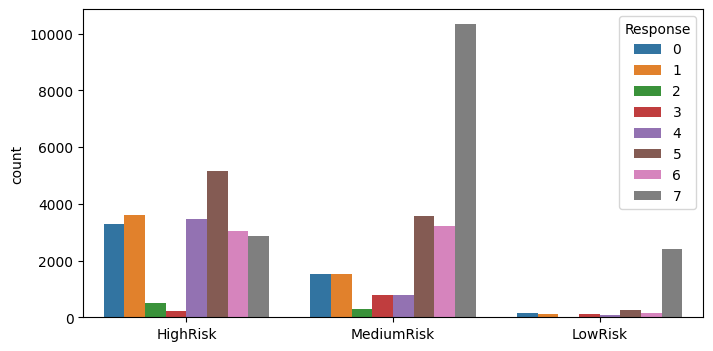

In [41]:
#7e. risk analysis based on BMI, Age, Weight, and Height classification

# define conditions for risk classification
high_risk = (top_ten_df['BMI_cat'] == 'overweight') | (top_ten_df['AGE_cat'] == 'old') | (top_ten_df['WT_cat'] == 'fat')
mid_risk = (top_ten_df['BMI_cat'] == 'normal') | (top_ten_df['AGE_cat'] == 'middleage') | (top_ten_df['WT_cat'] == 'slender')
low_risk = (top_ten_df['BMI_cat'] == 'underweight') | (top_ten_df['AGE_cat'] == 'young') | (top_ten_df['WT_cat'] == 'thin')

# assign values based on conditions
top_ten_df['Risk_Class'] = np.select([high_risk, mid_risk, low_risk], ['HighRisk', 'MediumRisk', 'LowRisk'], default='Unknown')

# create countplot
plt.figure(figsize=(8,4))
risk_order = ['HighRisk', 'MediumRisk', 'LowRisk']
sns.countplot(data = top_ten_df, x = 'Risk_Class', hue = y_eda, order=risk_order)
plt.xlabel('');

> <strong> insights
>> * fewer individuals in the low-risk category apply for insurance
>> * vast majority of applicants in medium risk category receive a response of '7'
>> * there are very few applicants receiving responses of '2' and '3'
>> * the majority of applicants fall within the average and high risk spectrum

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        8. Analysis of Imbalance in Target Variable
    </i></strong>
</h2>

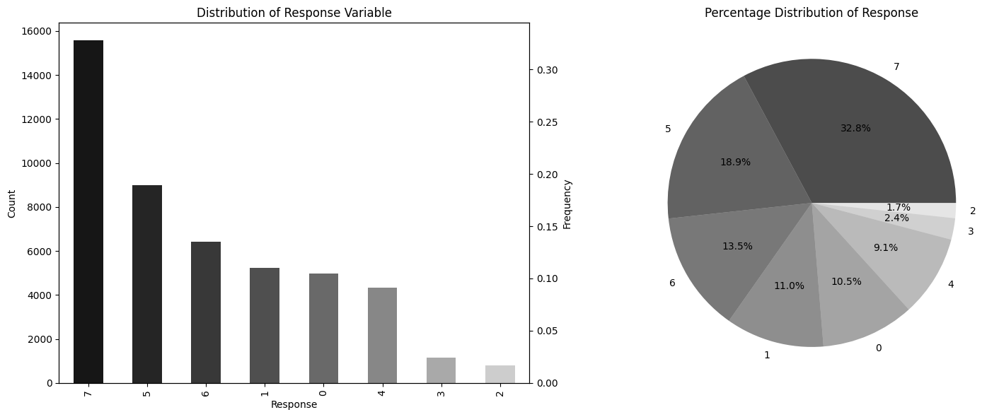

In [42]:
#8a. what is the distribution of the 'Response'/Target variable

# create a 1x2 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
colors = [(0, 0, 0, alpha) for alpha in np.linspace(0.7, 0.1, 8)]

# plot of count distribution
ax_left = y_eda.value_counts().plot(kind='bar', title='Distribution of Response Variable', color=colors, ylabel='Count', ax=axes[0])

# create a bar plot to merge count and frequency plots
ax_right = ax_left.twinx()

# plot of frequency distribution
(y_eda.value_counts() / y_eda.size).plot(kind='bar', ylabel='Frequency', ax=ax_right, color=colors)
ax_right.get_xaxis().set_visible(False)  # hide the secondary x-axis

# create a pie plot
y_eda.value_counts().plot.pie(autopct='%1.1f%%',ax=axes[1], ylabel='', title='Percentage Distribution of Response', colors=colors)

# adjust layout
plt.tight_layout()
plt.subplots_adjust(wspace=0.1)

> <strong> insights from the distribution of 'Response' variable reveals that:
>> * the response variable is inbalance and could result to bias model
>> * the higher frequency of '7' responses suggests a greater likelihood of this outcome for any given applicant
>> * data preprocessing techniques like SMOTE should be applied to rebalance the data

<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Cluster Analysis
</h2>

> <strong> objectives
>> * to examine the predictive performance of kmeans  when converting a multi-class problem into a binary classification
>> * to derive insights from the training dataset without relying on any prior label information

> <strong> steps
>> * determine the number of components to retain in dimentionality reduction using CERV or Kaiser's stopping rule
>> * base on above, apply PCA to reduce the dimensionality of the features
>> * analyze PCA result
>> * determine the number of cluster for the dataset using elbow plot
>> * base on above, fit KMeans clustering algorithm on the reduced data
>> * evaluate the results w.r.t target 'Response'
>> * group the reduced data by the clusters and analyze

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        1. Principal Component Analysis (PCA)
    </i></strong>
</h2>

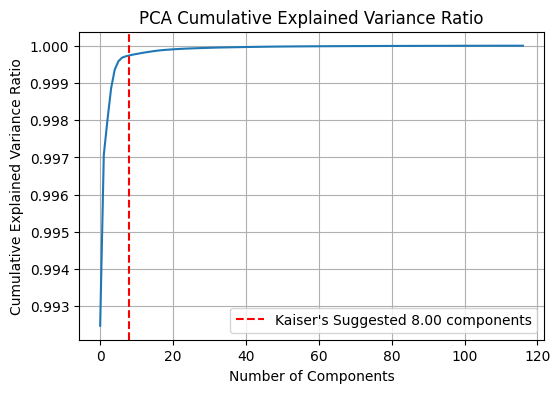

In [43]:
#1a. determine the number of components to retain in dimentionality reduction
## use cumulative explained variance ratio (CEVR) to determine the number of components
## the number of components at the point where the CEVR starts to level off is chosen as the number of components to retain
## or apply Kaiser's stopping rule: choose features where eigenvalues > 1

# fit PCA to features only
pca = PCA()
pca.fit(X_eda)

# plot cumulative explained variance ratio
plt.figure(figsize=(6, 4))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('PCA Cumulative Explained Variance Ratio')
plt.grid(True)

# show the number of components suggested by Kaiser on CEVR plot
components = np.sum(pca.explained_variance_ > 1) # apply Kaiser's stopping rule
plt.axvline(x=components, color='r', linestyle='--', linewidth=1.5, label=f'Kaiser\'s Suggested {components:.2f} components')
plt.legend();

# # view eigenvalues
# print(pca.explained_variance_.round(5).tolist())

In [44]:
#1b. suggested number of components, apply PCA to reduce the dimensionality of the features

# fit and transform the features with PCA
pca_1 = PCA(n_components=8)
X_pca = pca_1.fit_transform(X_eda)

# convert the new dataset to dataframe
X_pca_df = pd.DataFrame(X_pca)

# view the shape of old and new
print(f'Features of: {X_eda.shape} is reduced to: {X_pca_df.shape} principal components')

Features of: (47504, 117) is reduced to: (47504, 8) principal components


In [45]:
#1c. component Loadings

# component loadings represent the correlation coefficients between the original features and the principal components
# it indicate the strength and direction of the relationship between the original features and the components
# high absolute values of loadings indicate that the corresponding feature has a strong influence on the component
# for instance, if a component has high loadings for BMI features, it means that component represents BMI information

loadings_df = pd.DataFrame(pca_1.components_, columns=X_eda.columns)
loadings_df.rename_axis('PCA')

,Product_Info_1,Product_Info_2,Product_Info_3,Product_Info_4,Product_Info_5,Product_Info_6,Product_Info_7,Ins_Age,Ht,Wt,BMI,Employment_Info_1,Employment_Info_2,Employment_Info_3,Employment_Info_4,Employment_Info_5,Employment_Info_6,InsuredInfo_1,InsuredInfo_2,InsuredInfo_3,InsuredInfo_4,InsuredInfo_5,InsuredInfo_6,InsuredInfo_7,Insurance_History_1,Insurance_History_2,Insurance_History_3,Insurance_History_4,Insurance_History_7,Insurance_History_8,Insurance_History_9,Family_Hist_1,Medical_History_1,Medical_History_2,Medical_History_3,Medical_History_4,Medical_History_5,Medical_History_6,Medical_History_7,Medical_History_8,Medical_History_9,Medical_History_11,Medical_History_12,Medical_History_13,Medical_History_14,Medical_History_16,Medical_History_17,Medical_History_18,Medical_History_19,Medical_History_20,Medical_History_21,Medical_History_22,Medical_History_23,Medical_History_25,Medical_History_26,Medical_History_27,Medical_History_28,Medical_History_29,Medical_History_30,Medical_History_31,Medical_History_33,Medical_History_34,Medical_History_35,Medical_History_36,Medical_History_37,Medical_History_38,Medical_History_39,Medical_History_40,Medical_History_41,Medical_Keyword_1,Medical_Keyword_2,Medical_Keyword_3,Medical_Keyword_4,Medical_Keyword_5,Medical_Keyword_6,Medical_Keyword_7,Medical_Keyword_8,Medical_Keyword_9,Medical_Keyword_10,Medical_Keyword_11,Medical_Keyword_12,Medical_Keyword_13,Medical_Keyword_14,Medical_Keyword_15,Medical_Keyword_16,Medical_Keyword_17,Medical_Keyword_18,Medical_Keyword_19,Medical_Keyword_20,Medical_Keyword_21,Medical_Keyword_22,Medical_Keyword_23,Medical_Keyword_24,Medical_Keyword_25,Medical_Keyword_26,Medical_Keyword_27,Medical_Keyword_28,Medical_Keyword_29,Medical_Keyword_30,Medical_Keyword_31,Medical_Keyword_32,Medical_Keyword_33,Medical_Keyword_34,Medical_Keyword_35,Medical_Keyword_36,Medical_Keyword_37,Medical_Keyword_38,Medical_Keyword_39,Medical_Keyword_40,Medical_Keyword_41,Medical_Keyword_42,Medical_Keyword_43,Medical_Keyword_44,Medical_Keyword_45,Medical_Keyword_46,Medical_Keyword_47,Medical_Keyword_48
PCA,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000005,0.000673,-0.001009,-0.000020,0.000001,0.000057,-0.000003,-0.000015,-0.000007,-0.000005,-1.117235e-07,-0.000008,-0.000108,-0.000015,-1.464324e-07,0.000065,-0.000025,-0.000180,0.000002,-0.000025,-0.000010,-0.000008,0.000129,-0.000018,-0.000054,0.000016,0.000145,-0.000111,-0.000137,-0.000038,-0.000070,-0.000039,0.003290,0.999994,-0.000005,-0.000041,0.000006,-0.000010,0.000006,0.000023,-0.000093,-0.000003,0.000020,-0.000189,-0.000012,0.000099,-0.000013,0.000027,0.000025,-0.000011,0.000046,-0.000009,0.000086,-0.000074,0.000076,0.000001,0.000019,-0.000187,1.496154e-07,0.000001,-0.000041,-0.000102,0.000001,-0.000088,-0.000036,9.629613e-07,0.000022,-0.000017,0.000230,0.000010,0.000005,-0.000021,0.000008,7.822678e-07,0.000012,0.000007,0.000012,-0.000003,0.000011,0.000034,0.000005,0.000001,-0.000001,-0.000033,0.000008,0.000007,0.000007,0.000004,0.000003,0.000006,0.000007,0.000021,0.000003,-0.000025,0.000006,0.000004,0.000008,0.000003,0.000019,0.000003,0.000010,-0.000015,0.000009,-0.000004,0.000011,0.000033,-6.245422e-07,0.000005,0.000045,0.000002,0.000040,-0.000007,0.000001,0.000008,-0.000003,0.000008,0.000005
1,0.000222,0.010426,0.005643,0.001096,-0.000006,0.000035,-0.000175,-0.001108,0.000250,-0.000120,-4.685443e-04,0.000165,0.015526,-0.003254,-6.428151e-06,-0.000301,0.000120,-0.001282,0.000064,-0.001565,-0.000398,0.000049,-0.001615,0.000200,-0.000317,-0.000314,0.000657,-0.000442,-0.000631,-0.000370,-0.000283,0.000467,0.999672,-0.003286,-0.000400,0.000213,-0.000048,0.001794,0.000345,-0.001062,0.001936,0.000014,-0.000598,0.003698,-0.000042,-0.003619,0.000271,-0.000399,-0.000253,0.000251,-0.000818,-0.000006,0.009093,-0.001043,0.001012,0.000303,-0.000749,0.005762,-4.628558e-04,0.000007,-0.000262,0.001820,-0.000021,-0.000916,0.000287,-3.676152e-05,0.003827,0.000144,-0.

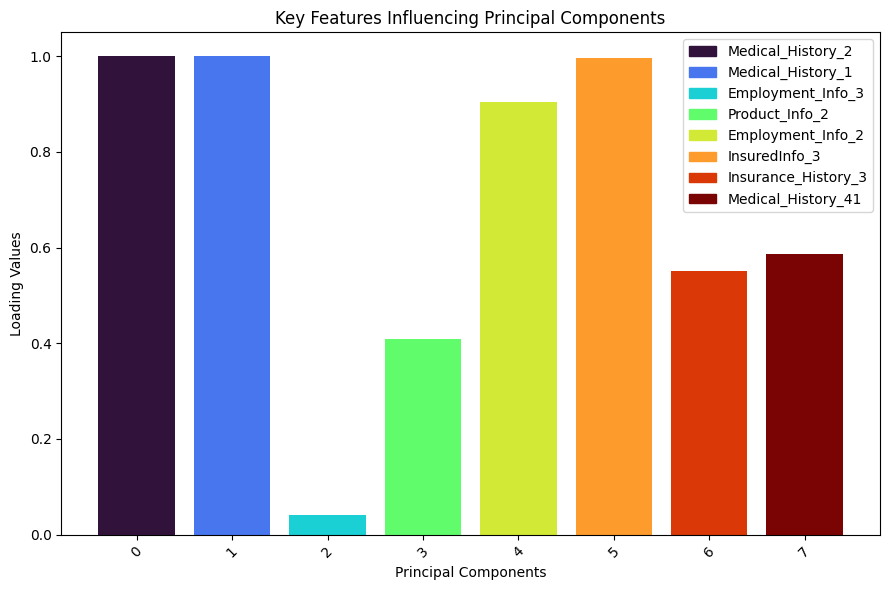

In [46]:
#1d. extract the key features influencing the principal components PC
## the key feature of each PC is the one with highest component loading value

# extract the feature contributing the most to each principal component base on component loading information
highest_value_columns = loadings_df.idxmax(axis=1)

# create lists to store highest values and corresponding column names
highest_values = []
column_names = []

# iterate over each row/principal component to extract highest values and column names
for idx, (index, row) in enumerate(loadings_df.iterrows()):
    highest_value = row.max()
    column_name = highest_value_columns[idx]
    highest_values.append(highest_value)
    column_names.append(column_name)

# define color palette for bars
colors = plt.cm.turbo(np.linspace(0, 1, len(column_names)))

# create a bar plot
plt.figure(figsize=(9, 6))
bars = plt.bar(loadings_df.index, highest_values, color=colors)
plt.xlabel('Principal Components')
plt.ylabel('Loading Values')
plt.title('Key Features Influencing Principal Components')
plt.xticks(loadings_df.index, rotation=45)

# create a legend with corresponding column names and colors
legend_handles = [plt.Rectangle((0,0),1,1, color=colors[i], label=column_names[i]) for i in range(len(column_names))]
plt.legend(handles=legend_handles)

plt.tight_layout()

> <strong> comment
>>  only 'Product_Inf_2' appears as a common feature in both PCA and Mutual Information Analysis

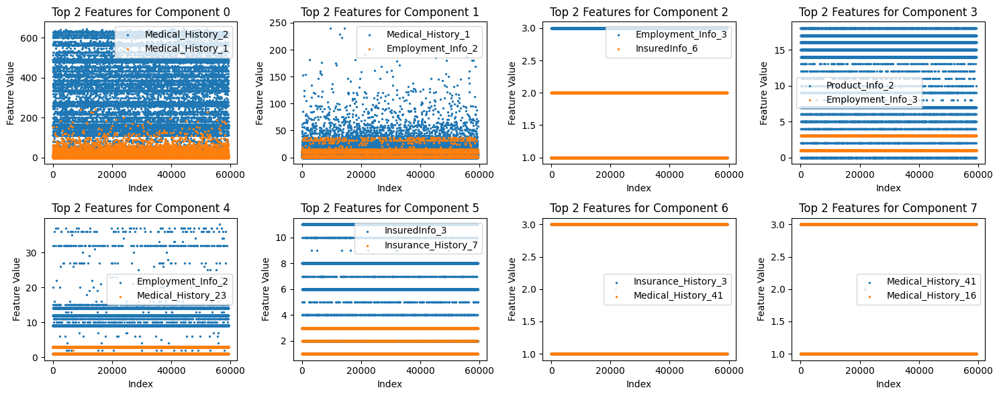

In [47]:
#1e. visualize the top (2) features contributing to each principal component

# number of top features to extract
top_ft = 2

# extract top features with the highest loading for each component
top_features_per_component = {}
for component in loadings_df.index:
    top_features = loadings_df.loc[component].nlargest(top_ft).index.tolist()
    top_features_per_component[component] = top_features

# plot the corresponding values of the top features for each component
fig, axes = plt.subplots(2, 4, figsize=(15, 6))
for i, (component, top_features) in enumerate(top_features_per_component.items()):
    ax = axes[i // 4, i % 4]
    for feature in top_features:
        ax.scatter(X_eda.index, X_eda[feature], s=2, label=feature)
    ax.set_xlabel('Index')
    ax.set_ylabel('Feature Value')
    ax.set_title(f'Top {top_ft} Features for Component {component}')
    ax.legend()
plt.tight_layout()

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        2. Clustering Analysis with KMeans Algorithm
    </i></strong>
</h2>

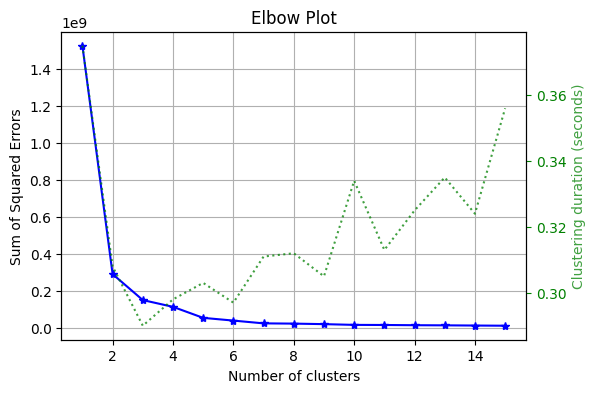

In [48]:
#2a. determine the number of cluster for the dataset using elbow plot
## the optimal number of clusters is identified at the elbow point, where the inertia starts to decrease at a slower rate
## in this plot, the number of cluster suggested is 2

k_model = KMeans(random_state=1)
plot_elbow_curve(k_model, X_pca_df, cluster_ranges=range(1, 16), figsize=(6, 4));

In [49]:
#2bi. clustering analysis with KMeans algorithm

# initialize a KMeans clustering model with 2 clusters
km_model = KMeans(2, random_state=1)

# fit the model and obtain cluster labels for the PCA-transformed data
y_cluster = km_model.fit_predict(X_pca_df)
## note: km_model.labels_ == y_cluster

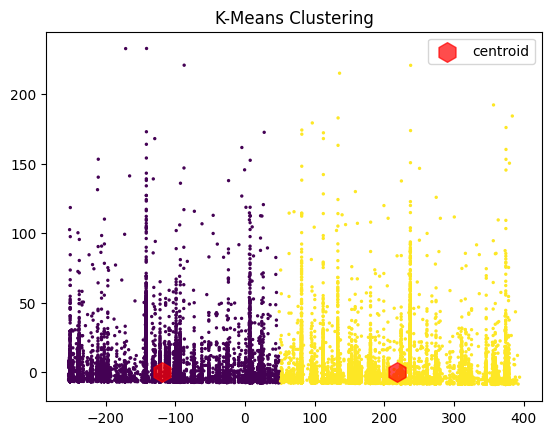

In [50]:
#2bii. visualization of clustering results and cluster centers

# Scatter plot of PCA-transformed data points with cluster assignments
plt.scatter(X_pca_df.iloc[:, 0], X_pca_df.iloc[:, 1], c=y_cluster, s=2, cmap='viridis')

# Scatter plot of cluster centers
centers = km_model.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', marker='h', s=200, alpha=0.7, label='centroid')
plt.title('K-Means Clustering')
plt.legend();

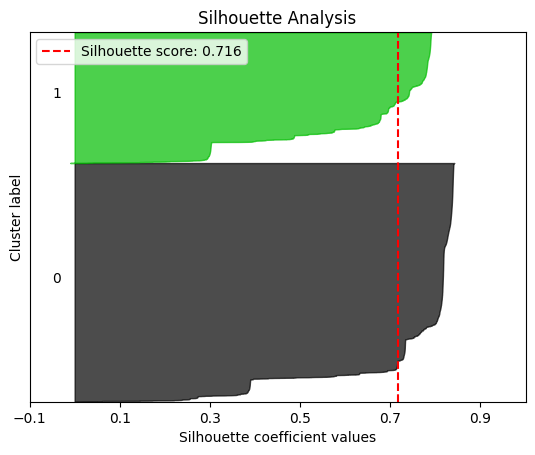

In [51]:
#2biii. plot the silhouette scores for each sample using the cluster labels generated above
## the average silhouette score for all samples is shown on the plot which measures the quality of clustering
## higher average silhouette score indicates better clustering

plot_silhouette(X_pca_df, y_cluster); #OR
# plot_silhouette(X_pca_df, km_model.labels_);

> <strong> cluster evaluation
>> * to evaluate the cluster with respect to the Response variable, the multiclass classification problem is converted to binary classification problem
>> * the meaning of each Response value is ambiguous; however, for the binary classification problem, we will assume that responses in the range of 0 to 6 indicate acceptance (coded '1'), while a response of 7 signifies rejection (coded '0')
>> * the cluster assignment will be assessed against the new binary response (original labels) to determine the degree of similarity between them

In [52]:
# generate a ney binary Response label from the original Response
## assign binary value of '0' to Response of 0 to 6 and binary value of '1' to Response of 7

#binary conversion of the multiclass variable
y_response = y_eda.apply(lambda x: 0 if 0 <= x <= 6 else (1 if x == 7 else x))

Accuracy: 0.5497221286628494
F1_score: 0.3398555644713289


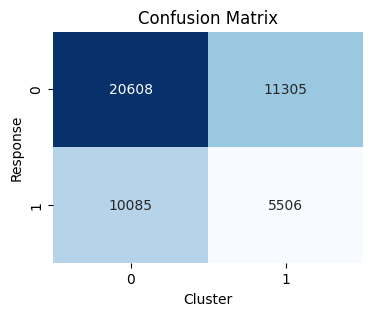

In [53]:
#2cii. evaluate the cluster assignments against the original binary labels

# create the confusion matrix
cm = confusion_matrix(y_response, y_cluster)

# calculate accuracy and f1_score from confusion matrix
cluster_accuracy = accuracy_score(y_response, y_cluster)
cluster_f1score = f1_score(y_response, y_cluster)

# print the accuracy and f1_score
print(f'Accuracy: {cluster_accuracy}\nF1_score: {cluster_f1score}')

# Plot the confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Cluster')
plt.ylabel('Response')
plt.title('Confusion Matrix')
plt.show()

> <strong> Conclusion
>> given an accuracy of 0.55 and an F1 score of 0.33 for the current problem, it can be concluded that the generated cluster does not effectively represent the binary classes of the Response variable.

<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Base Model
</h2>

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        1. Prepare Dataset for Baseline Model
    </i></strong>
</h2>

In [54]:
#1a. create copies of X_train, X_val for base model

X_train_00 = X_train.copy()
X_val_00 = X_val.copy()
test_df_00 = test_df.copy()

In [55]:
#1b. convert 'Product_Info_2' to numeric using LabelEncoder

# check if the unique values of 'Product_Info_2' are consistent between training and validation sets
result = sorted(X_train_00['Product_Info_2'].unique()) == sorted(X_val_00['Product_Info_2'].unique())
print('Are the unique values of \'Product_Info_2\' consistent between training and validation sets?', result)

# initialize the encoder
enc_cat1 = LabelEncoder()

# fit_transform the training set and only transform the validation set
X_train_00['Product_Info_2'] = enc_cat1.fit_transform(X_train_00['Product_Info_2'])
X_val_00['Product_Info_2'] = enc_cat1.transform(X_val_00['Product_Info_2'])

Are the unique values of 'Product_Info_2' consistent between training and validation sets? True


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        2. Baseline Model - MLPClassifier
    </i></strong>
</h2>

In [56]:
#2a. training and prediction with MLPClassifier for base model

# instantiate MLPClassifier
nn = MLPClassifier((100,8), learning_rate_init=0.001, activation='relu', solver='adam', random_state=1)

# fit the classifier to the training data
nn.fit(X_train_00, y_train)

# evaluate the classifier on the testing data
y_nn = nn.predict(X_val_00)

# compute the accuracy, F1 score and confusion matrix for MLP classifier
accuracy_00 = accuracy_score(y_val, y_nn)
f1score_00 = f1_score(y_val,y_nn, average='weighted')
cm_00 = confusion_matrix(y_val, y_nn)
print(f'Accuracy: {accuracy_00}, F1-score: {f1score_00}')

Accuracy: 0.4970110297213101, F1-score: 0.4675476814003305


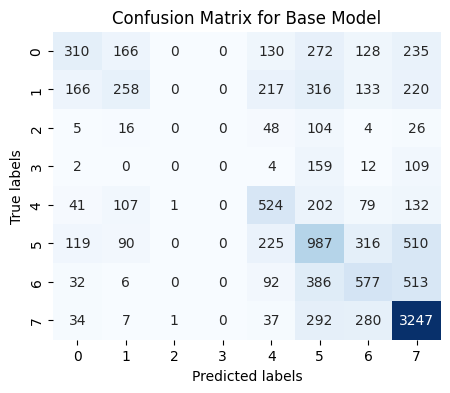

In [57]:
#2b. Plot the confusion matrix as a heatmap
plt.figure(figsize=(5, 4))
sns.heatmap(cm_00, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for Base Model');

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        3. Baseline Model - RandomForestClassifier
    </i></strong>
</h2>

In [58]:
#3a. create a RandomForestClassifier function metrics

def random_forest_metrics(Train, Validate):
    
    # initialize RandomForestClassifier
    rf = RandomForestClassifier(random_state=1)
    
    # fit the classifier to the training data
    rf.fit(Train, y_train)
    
    # make predictions on the test data
    predict = rf.predict(Validate)
    
    # calculate accuracy and F1 score
    accuracy = accuracy_score(y_val, predict)
    f1 = f1_score(y_val, predict, average='weighted')
    
    return accuracy, f1

In [59]:
#3b. evaluate the baseline model using rf

accuracy, f1 = random_forest_metrics(X_train_00, X_val_00)
print(f'Accuracy: {accuracy}, F1 Score: {f1}')

Accuracy: 0.5313631388397744, F1 Score: 0.4970838699655216


<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Feature Engineering
</h2>

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        Prepapare Dataset for Feature Engineering
    </i></strong>
</h2>

In [60]:
# create copies of X_train, X_val for feature engineering

X_train_01 = X_train.copy()
X_val_01 = X_val.copy()
test_df_01 = test_df.copy()

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        1. Target Encoding
        <a href='https://contrib.scikit-learn.org/category_encoders/targetencoder.html'> [ref_library] </a>
    </i></strong>
</h2>

> * 'Product_Info_2' is a feature that has been identified by both Mutual Information and PCA as having a significant impact on prediction. It is among the top key features that determine the principal component
> * in order to capture the relationship between the categorical variable 'Product_Info_2' and the target variable 'Response', we apply target encoding techniques

In [61]:
#1a. create a new feature from 'Product_Info_2' using target encoding technique

# before computing the mean, convert categorical variable of y_train to integer codes
y_train_numeric = y_train.cat.codes

# compute the mean target encoding using groupby and transform
mean_target = y_train_numeric.groupby(X_train_01['Product_Info_2']).transform('mean')

# fit the calculated mean target encoding to a new column in the training set
X_train_01['Target_Prod_Info_2'] = mean_target

# create a mapping of Product_Info_2 to the mean target encoding
mean_target_map = y_train_numeric.groupby(X_train_01['Product_Info_2']).mean().to_dict()

# transform the calculated mean target encoding to a new column in validation and test sets
X_val_01['Target_Prod_Info_2'] = X_val_01['Product_Info_2'].map(mean_target_map)
test_df_01['Target_Prod_Info_2'] = test_df_01['Product_Info_2'].map(mean_target_map)

# convert categorical column 'Target_Prod_Info_2' to float
X_train_01['Target_Prod_Info_2'] = X_train_01['Target_Prod_Info_2'].astype(float)
X_val_01['Target_Prod_Info_2'] = X_val_01['Target_Prod_Info_2'].astype(float)
test_df_01['Target_Prod_Info_2'] = test_df_01['Target_Prod_Info_2'].astype(float)

In [62]:
#1b. evaluate the effect of target encoding

temp_train_df1 = X_train_01.drop(columns=['Product_Info_2'])
temp_val_df1 = X_val_01.drop(columns=['Product_Info_2'])

accuracy1, f11 = random_forest_metrics(temp_train_df1, temp_val_df1)
print(f'Accuracy: {accuracy1}, F1 Score: {f11}')

Accuracy: 0.5327102803738317, F1 Score: 0.49727438032012644


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        2 Frequency Encoding
    </i></strong>
</h2>

> trying frequency encoding option on 'Product_Info_2' to see if it works better on evaluation

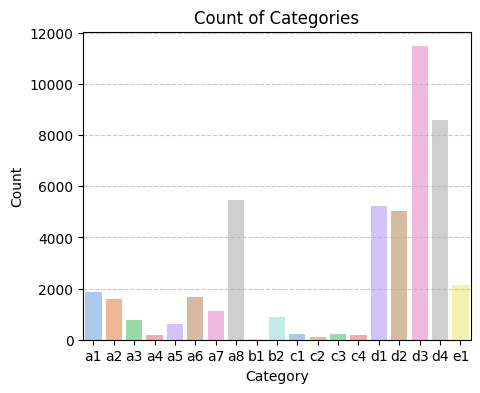

In [63]:
# 2a. visualize the frequency plot of Product_Info_2

plt.figure(figsize=(5, 4))
sns.countplot(data=X_train_01, x='Product_Info_2', palette='pastel')
plt.title('Count of Categories')
plt.xlabel('Category')
plt.ylabel('Count')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [64]:
#2b. implement frequency encoding and apply it to training and validation sets

# calculate frequencies based on the training set
freq_count = X_train_01['Product_Info_2'].value_counts(normalize=True)

# apply frequency encoding to training, validation and test sets
X_train_01['Freq_Prod_Info_2'] = X_train_01['Product_Info_2'].map(freq_count)
X_val_01['Freq_Prod_Info_2'] = X_val_01['Product_Info_2'].map(freq_count)
test_df_01['Freq_Prod_Info_2'] = test_df_01['Product_Info_2'].map(freq_count)

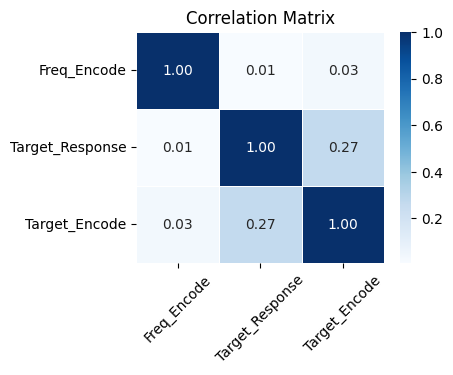

In [65]:
#2c. check for multicollinearity between the target encoded and frequency encoded features using correlation matrix

# create a df for the columns to compare
data = {
    'Freq_Encode': X_train_01['Freq_Prod_Info_2'],
    'Target_Response': y_train,
    'Target_Encode': X_train_01['Target_Prod_Info_2']}
df = pd.DataFrame(data)

# calculate the correlation matrix
correlation_matrix = df.corr()

# visualize the correlation matrix using a heatmap
plt.figure(figsize=(4, 3))
heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt='.2f', linewidths=.5)
plt.title('Correlation Matrix')
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45);

In [66]:
#2d. evaluate the effect of frequency encoding

temp_train_df2 = X_train_01.drop(columns=['Product_Info_2'])
temp_val_df2 = X_val_01.drop(columns=['Product_Info_2'])

accuracy2, f12 = random_forest_metrics(temp_train_df2, temp_val_df2)
print(f'Accuracy: {accuracy2}, F1 Score: {f12}')

Accuracy: 0.532036709606803, F1 Score: 0.4971793827294147


> <strong> observation
>> * the target encode has more correlation to the target than frequency encoding
>> * frequency encoding and target encoding show negligible correlation, indicating no multicollinearity between these encoding methods
>> * both encoding techniques have no significant impact on the evaluation metrics

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        3. Bin Continuous Features
    </i></strong>
</h2>

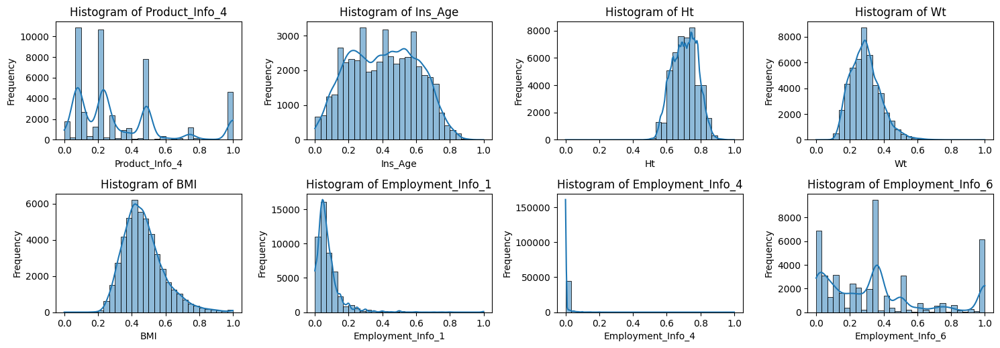

In [67]:
#3a. visualize the histogram plot of continuous features to consider for bining

# continuous features to consider for bining
cont_features = ['Product_Info_4', 'Ins_Age', 'Ht', 'Wt', 'BMI', 
                    'Employment_Info_1', 'Employment_Info_4', 'Employment_Info_6']

# Plot histograms for each feature
plt.figure(figsize=(15, 10))
for i, feature in enumerate(cont_features, 1):
    plt.subplot(4, 4, i)
    sns.histplot(data=X_train_01[feature], bins=30, kde=True)
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {feature}')
plt.tight_layout()

> <strong> based on the histogram plot, it appears reasonable to bin the following continuous variables:
>> * Ins_Age, Ht, Wt, BMI

In [68]:
#3b. bin the 'Age_Ins' using kmeans in KBinsDiscretizer

# initialize KBinsDiscretizer
bin_age = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='quantile')

# fit the bins to the X_train_01 and transform X_val_01, test_df_01, and X_train_01
X_train_01['age_bin'] = bin_age.fit_transform(X_train_01[['Ins_Age']])
X_val_01['age_bin'] = bin_age.transform(X_val_01[['Ins_Age']])
test_df_01['age_bin'] = bin_age.transform(test_df_01[['Ins_Age']])

# view the 'age' bins
bin_edges1 = bin_age.bin_edges_[0]
print('Following are the age bins:')
for i in range(len(bin_edges1) - 1):
    print(f'Category {i}: From {bin_edges1[i]} to {bin_edges1[i + 1]}')

Following are the age bins:
Category 0: From 0.0 to 0.2985074520111084
Category 1: From 0.2985074520111084 to 0.5074626803398132
Category 2: From 0.5074626803398132 to 1.0


In [69]:
#3c. bin the 'Ht' using kmeans in KBinsDiscretizer

# initialize KBinsDiscretizer
bin_ht = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='quantile')

# fit the bins to the X_train_01 and transform X_val_01, test_df_01, and X_train_01
X_train_01['ht_bin'] = bin_ht.fit_transform(X_train_01[['Ht']])
X_val_01['ht_bin'] = bin_ht.transform(X_val_01[['Ht']])
test_df_01['ht_bin'] = bin_ht.transform(test_df_01[['Ht']])

# view the 'ht' bins
bin_edges2 = bin_ht.bin_edges_[0]
print('Following are the height bins:')
for i in range(len(bin_edges2) - 1):
    print(f'Category {i}: From {bin_edges2[i]} to {bin_edges2[i + 1]}')

Following are the height bins:
Category 0: From 0.0 to 0.6727272868156433
Category 1: From 0.6727272868156433 to 0.7454545497894287
Category 2: From 0.7454545497894287 to 1.0


In [70]:
#3d. bin the 'Wt' using kmeans in KBinsDiscretizer

# initialize KBinsDiscretizer
bin_wt = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='quantile')

# fit the bins to the X_train_01 and transform X_val_01, test_df_01, and X_train_01
X_train_01['wt_bin'] = bin_wt.fit_transform(X_train_01[['Wt']])
X_val_01['wt_bin'] = bin_wt.transform(X_val_01[['Wt']])
test_df_01['wt_bin'] = bin_wt.transform(test_df_01[['Wt']])

# view the 'wt' bins
bin_edges3 = bin_wt.bin_edges_[0]
print('Following are the wt bins:')
for i in range(len(bin_edges3) - 1):
    print(f'Category {i}: From {bin_edges3[i]} to {bin_edges3[i + 1]}')

Following are the wt bins:
Category 0: From 0.0 to 0.24686191976070404
Category 1: From 0.24686191976070404 to 0.3200836777687073
Category 2: From 0.3200836777687073 to 1.0


In [71]:
#3e. bin the 'BMI' using kmeans in KBinsDiscretizer

# initialize KBinsDiscretizer
bin_bmi = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='quantile')

# fit the bins to the X_train_01 and transform X_val_01, test_df_01, and X_train_01
X_train_01['bmi_bin'] = bin_bmi.fit_transform(X_train_01[['BMI']])
X_val_01['bmi_bin'] = bin_bmi.transform(X_val_01[['BMI']])
test_df_01['bmi_bin'] = bin_bmi.transform(test_df_01[['BMI']])

# view the 'bmi' bins
bin_edges4 = bin_bmi.bin_edges_[0]
print('Following are the bmi bins:')
for i in range(len(bin_edges4) - 1):
    print(f'Category {i}: From {bin_edges4[i]} to {bin_edges4[i + 1]}')

Following are the bmi bins:
Category 0: From 0.0 to 0.4100938141345978
Category 1: From 0.4100938141345978 to 0.5011845827102661
Category 2: From 0.5011845827102661 to 1.0


In [72]:
#3f. evaluate the effect of binning

temp_train_df3 = X_train_01.drop(columns=['Product_Info_2'])
temp_val_df3 = X_val_01.drop(columns=['Product_Info_2'])

accuracy3, f13 = random_forest_metrics(temp_train_df3, temp_val_df3)
print(f'Accuracy: {accuracy3}, F1 Score: {f13}')

Accuracy: 0.5276584996211164, F1 Score: 0.49153104308220114


> <strong> comment
>> * binning above variables reduces the scores of prediction

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        4. Feature Interaction
    </i></strong>
</h2>

> <strong> create a weight to height ratio using BMI and  height information
>> * BMI = weight/height²
>> * BMI * height = weight / height

In [73]:
#4ai. BMI-Ht interaction feature for training and validation sets

# create the new column for the training set
X_train_01['BMI_Ht'] = X_train_01['BMI'] * X_train_01['Ht']

# apply the same calculation to the validation and test sets
X_val_01['BMI_Ht'] = X_val_01['BMI'] * X_val_01['Ht']
test_df_01['BMI_Ht'] = test_df_01['BMI'] * test_df_01['Ht']

In [74]:
#4aii. evaluate the effect of interaction between BMI and weight

temp_train_df4a = X_train_01.drop(columns=['Product_Info_2'])
temp_val_df4a = X_val_01.drop(columns=['Product_Info_2'])

accuracy4a, f14a = random_forest_metrics(temp_train_df4a, temp_val_df4a)
print(f'Accuracy: {accuracy4a}, F1 Score: {f14a}')

Accuracy: 0.5307737644186242, F1 Score: 0.4951971654456601


> <strong> create a new feature called Risk_Cat
>> * the risk feature is derived from the binned datasets by capturing the interactions among BMI, age, and weight

In [75]:
#4bi. risk classification based on quantile thresholds for Age, Weight, and BMI

# define conditions for risk classification
def risk_class(row):
    if (row['age_bin'] == 2) or (row['wt_bin'] == 2) or (row['bmi_bin'] == 2):
        return 2
    elif (row['age_bin'] == 1) or (row['wt_bin'] == 1) or (row['bmi_bin'] == 1):
        return 1
    elif (row['age_bin'] == 0) or (row['wt_bin'] == 0) or (row['bmi_bin'] == 0):
        return 0

# create new feature base on conditions above
X_train_01['Risk_Cat'] = X_train_01.apply(risk_class, axis=1)
X_val_01['Risk_Cat'] = X_val_01.apply(risk_class, axis=1)
test_df_01['Risk_Cat'] = test_df_01.apply(risk_class, axis=1)

In [76]:
#4bii. evaluate the effect of interaction for risk classes

temp_train_df4b = X_train_01.drop(columns=['Product_Info_2'])
temp_val_df4b = X_val_01.drop(columns=['Product_Info_2'])

accuracy4b, f14b = random_forest_metrics(temp_train_df4b, temp_val_df4b)
print(f'Accuracy: {accuracy4b}, F1 Score: {f14b}')

Accuracy: 0.532457691336196, F1 Score: 0.4954008336313404


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        5. Encoding Categorical Data
    </i></strong>
</h2>

In [77]:
#5a. apply label encode to 'Product_Info_2'

# initialize the encoder
enc1 = LabelEncoder()

# fit_transform the training set and only transform the validation set
X_train_01['Product_Info_2'] = enc1.fit_transform(X_train_01['Product_Info_2'])
X_val_01['Product_Info_2'] = enc1.transform(X_val_01['Product_Info_2'])
test_df_01['Product_Info_2'] = enc1.transform(test_df_01['Product_Info_2'])

In [78]:
#5b. evaluate the effect of encoding

temp_train_df5 = X_train_01
temp_val_df5 = X_val_01

accuracy5, f15 = random_forest_metrics(temp_train_df5, temp_val_df5)
print(f'Accuracy: {accuracy5}, F1 Score: {f15}')

Accuracy: 0.5269007325082091, F1 Score: 0.4915451566397305


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        Prune Less Impactful Features
    </i></strong>
</h2>

> <strong> conclusion
>> after exploring various feature engineering techniques, it's evident that only target encoding has made a significant positive impact on both accuracy and F1 score. Therefore, moving forward, only the newly created column resulting from target encoding will be retained for subsequent modeling steps. Consequently, the original column that underwent target encoding will be removed from the dataset:

In [79]:
# feature engineered data sets are:
X_train_02 = pd.concat([X_train_01['Target_Prod_Info_2'], X_train_00.drop(columns=['Product_Info_2'])], axis=1)
X_val_02 = pd.concat([X_val_01['Target_Prod_Info_2'], X_val_00.drop(columns=['Product_Info_2'])], axis=1)
test_df_02 = pd.concat([test_df_01['Target_Prod_Info_2'], test_df_00.drop(columns=['Product_Info_2'])], axis=1)

In [80]:
# check the shapes of the variables for consistency
print(f'X_train shape: {X_train.shape}, X_val shape: {X_val.shape}, y_train shape: {y_train.shape}, y_val shape: {y_val.shape}')
print(f'X_train_00 shape: {X_train_00.shape}, X_val_00 shape: {X_val_00.shape}, test_df_00 shape: {test_df_00.shape}')
print(f'X_train_01 shape: {X_train_01.shape}, X_val_01 shape: {X_val_01.shape}, test_df_01 shape: {test_df_01.shape}')
print(f'X_train_02 shape: {X_train_02.shape}, X_val shape: {X_val_02.shape}, test_df_02 shape: {test_df_02.shape}')

X_train shape: (47504, 117), X_val shape: (11877, 117), y_train shape: (47504,), y_val shape: (11877,)
X_train_00 shape: (47504, 117), X_val_00 shape: (11877, 117), test_df_00 shape: (19765, 117)
X_train_01 shape: (47504, 125), X_val_01 shape: (11877, 125), test_df_01 shape: (19765, 125)
X_train_02 shape: (47504, 117), X_val shape: (11877, 117), test_df_02 shape: (19765, 117)


> <strong> top features are selected after feature engineering using both variance and mutual information
>> * low variance features are first eliminated based on threshold value
>> * the top features with high mutual information with the target variable are then selected

In [81]:
# step 1: use VarianceThreshold to remove features with low variance
var_threshold = 0
var_selector = VarianceThreshold(threshold=var_threshold)
selected_features_1 = var_selector.fit_transform(X_train_02)

# step 2: use SelectKBest with mutual_info_classif to select features based on mutual information
k = 117
MI_selector = SelectKBest(score_func=mutual_info_classif, k=k)
X_train_selected = MI_selector.fit_transform(selected_features_1, y_train)

# get the selected features indices
selected_features_indx = MI_selector.get_support(indices=True)

# subset the original feature names using the selected feature indices
selected_features = X_train_02.columns[selected_features_indx]

In [82]:
# evaluate the model after selection

temp_train_df = X_train_02[selected_features]
temp_val_df = X_val_02[selected_features]

accuracy6, f16 = random_forest_metrics(temp_train_df, temp_val_df)
print(f'Accuracy: {accuracy6}, F1 Score: {f16}')

Accuracy: 0.5335522438326177, F1 Score: 0.49896912512219116


<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Hyper-parameter Tuning
</h2>

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        Define Tuning Function
    </i></strong>
</h2>

> <strong> objectives
>> * to tune hyperparameters of chosen ML algorithms to find optimal settings
>> * to refit the whole data sets using optimal settings for improve performance
>> * stack the algorithm to further improve performance

> <strong> note
>> * F1_Score is used to evaluate hyper-parameter tuning
>> * SMOTEENN is applied to tackle imbalance
>> * StratifiedKFold is used to distribute target variable evenly

In [ ]:
# function for hyper-parameter tuning

def perform_random_search(X, y, classifier, param_grid):
    '''
    Perform randomized search for hyperparameter optimization of a classifier
    it uses SMOTEENN, StratifiedKFold, and f1_score
    '''

    ## initialize parameters
    # SMOTEENN for imbalance
    smote_enn = SMOTEENN(random_state=1)
    # scoring metrics
    scoring = make_scorer(f1_score, average='weighted')
    # cross-validation with stratifiedKFold
    skf1 = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
    
    # pipeline for classifier algorithm with SMOTEENN
    pipeline = make_pipeline(smote_enn, classifier)

    # parameter grid for pipeline: loop through the parameters defined in the param_grid
    param_grid_pipeline = {f'{classifier.__class__.__name__.lower()}__{key}': value for key, value in param_grid.items()}

    # initialize RandomizedSearchCV for classifier algorithm
    random_search = RandomizedSearchCV(estimator=pipeline, param_distributions=param_grid_pipeline,
                                       scoring=scoring, refit='f1', cv=skf1, n_iter=25, random_state=1, n_jobs=-1)

    # fit RandomizedSearchCV for the algorithm
    random_search.fit(X, y)
    
    # get results, best score and best parameters
    best_score = random_search.best_score_
    best_params = random_search.best_params_
    random_search_results = random_search.cv_results_

    return best_score, best_params, random_search_results

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        1. Tuning RandomForestClassifier - Ensemble method | Bagging
    </i></strong>
</h2>

In [ ]:
#1a. tuning RandomForestClassifier

# initialize rf
rf_class = RandomForestClassifier(random_state=1)

# parameter grid for rf
rf_grid = {'max_depth': np.arange(5, 8)}

# get best f1_score and best parameters for rf
rf_score, rf_param, rf_results = perform_random_search(X_train_02, y_train, rf_class, rf_grid)
print(f'Best Score: {rf_score}\nBest Parameters: {rf_param}')

# rf_tuned = RandomForestClassifier(max_depth=7, n_estimators=99)
# Best Score: 0.27627996397946875

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        2. Tuning XGBClassifier - Ensemble method | Boosting
    </i></strong>
</h2>

In [ ]:
#2a. tuning XGBClassifier

# initialize xgboost
xgb_class = xgb.XGBClassifier(random_state=1)

# parameter grid for xgboost
xgb_grid = {'learning_rate': [0.05, 0.1, 0.2]}

# get best fi_score and best parameters
xgb_score, xgb_param, xgb_results = perform_random_search(X_train_02, y_train, xgb_class, xgb_grid)
print(f'Best Score: {xgb_score}\nBest Parameters: {xgb_param}')

# xgb_tuned = xgb.XGBClassifier(max_depth=6,n_estimators=200,learning_rate=0.1)
# Best Score: 0.599771645041814

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        3. Tuning CatBoostClassifier  - Ensemble method | Gradient Boosting
    </i></strong>
</h2>

In [ ]:
#3a. tuning catboost

# initialize catboost
catbst_class = CatBoostClassifier(loss_function='MultiClass', random_seed=1)

# parameter grid
catbst_grid = {'iterations': [100, 200, 3000]}

# get best fi_score and best parameters
catbst_score, catbst_param, catbst_results = perform_random_search(X_train_02, y_train, catbst_class, catbst_grid)
print(f'Best Score: {catbst_score}\nBest Parameters: {catbst_param}')

# catbst_tuned = CatBoostClassifier(loss_function='MultiClass', random_seed=1, depth=6, iterations=3000)
# Best Score: 0.39678527460527596

<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Evaluate Model Performance
</h2>

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        1. Retrain RandomForestClassifier with Full Training Dataset & Predict
    </i></strong>
</h2>

In [83]:
#1a. train and predict with tunnned RandomForestClassifier hyperparameter

# initialize the model
rf_tuned = RandomForestClassifier(max_depth=None, random_state=1)

# train rf model
rf_tuned.fit(X_train_02, y_train)

# make predictions
rf_predict = rf_tuned.predict(X_val_02)
rf_predict_proba = rf_tuned.predict_proba(X_val_02)[:, 1]

# calculate scores
rf_accuracy = accuracy_score(y_val, rf_predict)
rf_f1 = f1_score(y_val, rf_predict, average='weighted')
#rf_auc = roc_auc_score(y_val, rf_predict)

# print scores
print(f'Accuracy: {rf_accuracy}, F1 Score: {rf_f1}')
rf_result = [rf_accuracy, rf_f1]

Accuracy: 0.5335522438326177, F1 Score: 0.49896912512219116


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        2. Retrain XGBClassifier with Full Training Dataset & Predict
    </i></strong>
</h2>

In [84]:
#2a. train and predict with XGBClassifier

# initialize the model
xgb_tuned = xgb.XGBClassifier(learning_rate=0.1, random_state=1)

# train xgb model
xgb_tuned.fit(X_train_02, y_train)

# make predictions
xgb_predict = xgb_tuned.predict(X_val_02)
xgb_predict_proba = xgb_tuned.predict_proba(X_val_02)[:, 1]

# calculate scores
xgb_accuracy = accuracy_score(y_val, xgb_predict)
xgb_f1 = f1_score(y_val, xgb_predict, average='weighted')

# print scores
print(f'Accuracy: {xgb_accuracy}, F1 Score: {xgb_f1}')
xgb_result = [xgb_accuracy, xgb_f1]

Accuracy: 0.5402037551570262, F1 Score: 0.5102217746166213


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        3. Retrain CatBoostClassifier with Full Training Dataset & Predict
    </i></strong>
</h2>

In [85]:
#3a. train and predict with CatBoostClassifier

# initialize the model
catbst_tuned = CatBoostClassifier(loss_function='MultiClass', verbose=False, random_seed=1)

# train catboost model
catbst_tuned.fit(X_train_02, y_train, verbose=False)

# make predictions
catbst_predict = catbst_tuned.predict(X_val_02)
catbst_predict_proba = catbst_tuned.predict_proba(X_val_02)[:, 1]

# calculate scores
catbst_accuracy = accuracy_score(y_val, catbst_predict)
catbst_f1 = f1_score(y_val, catbst_predict, average='weighted')

# print scores
print(f'Accuracy: {catbst_accuracy}, F1 Score: {catbst_f1}')
catbst_result = [catbst_accuracy, catbst_f1]

Accuracy: 0.5402879515029048, F1 Score: 0.5158132058254402


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        4. Train and Predict with Stacked Model
    </i></strong>
</h2>

In [86]:
#4a. train and predict with stacked models

# define base models
base_models = [('xgb', xgb_tuned), ('rf', rf_tuned), ('catb', catbst_tuned)]

# define meta-model
np.random.seed(1)
meta_model = LogisticRegression()

# initialize stacking classifier
stacking_classifier = StackingClassifier(estimators=base_models, final_estimator=meta_model)

# train stacked model
stacking_classifier.fit(X_train_02, y_train)

# make predictions
stack_predict = stacking_classifier.predict(X_val_02)
stack_predict_proba = stacking_classifier.predict_proba(X_val_02)[:, 1]

# calculate scores
st_accuracy = accuracy_score(y_val, stack_predict)
st_f1 = f1_score(y_val, stack_predict, average='weighted')

# print scores
print(f'Accuracy: {st_accuracy}, F1 Score: {st_f1}')
stacked_result = [st_accuracy, st_f1]

Accuracy: 0.5474446409025848, F1 Score: 0.5261620968162345


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        5. Train and Predict with FeedForward Neural Network FNN / Multilayer Perceptron MLP
    </i></strong>
</h2>

In [87]:
#5a. split the data into training and validation sets
## does not consider data leakage for this FNN split

# split the data
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(X_train_02, y_train, test_size=0.15, random_state=1)

In [88]:
#5aii. define FNN/MLP architecture

# define the model architecture using the Keras Sequential API
model = Sequential()
model.add(Dense(units=128, input_shape=(117,), activation='relu'))  # input layer
model.add(Dense(units=64, activation='relu'))  # add hidden layer
model.add(Dropout(0.3)) # to avoid overfitting
model.add(Dense(units=32, activation='relu'))  # add hidden layer
model.add(Dense(units=16, activation='relu'))  # add hidden layer
model.add(Dense(units=8, activation='softmax'))  # output layer with 8 neurons for 8 classes, using softmax activation for multi-class classification
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               15104     
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 16)                528       
                                                                 
 dense_4 (Dense)             (None, 8)                 136       
                                                                 
Total params: 26104 (101.97 KB)
Trainable params: 26104 

Epoch 1/100
1485/1485 [==============================] - 8s 4ms/step - loss: 1.8859 - accuracy: 0.3174 - val_loss: 1.7821 - val_accuracy: 0.3214 - lr: 0.0010
Epoch 2/100
1485/1485 [==============================] - 4s 2ms/step - loss: 1.7193 - accuracy: 0.3571 - val_loss: 1.6644 - val_accuracy: 0.3803 - lr: 0.0010
Epoch 3/100
1485/1485 [==============================] - 4s 2ms/step - loss: 1.6318 - accuracy: 0.3953 - val_loss: 1.6546 - val_accuracy: 0.4186 - lr: 0.0010
Epoch 4/100
1485/1485 [==============================] - 4s 2ms/step - loss: 1.6007 - accuracy: 0.4079 - val_loss: 1.6019 - val_accuracy: 0.4231 - lr: 0.0010
Epoch 5/100
1485/1485 [==============================] - 4s 2ms/step - loss: 1.5756 - accuracy: 0.4185 - val_loss: 1.5820 - val_accuracy: 0.4265 - lr: 0.0010
Epoch 6/100
1485/1485 [==============================] - 4s 2ms/step - loss: 1.5577 - accuracy: 0.4258 - val_loss: 1.5500 - val_accuracy: 0.4290 - lr: 0.0010
Epoch 7/100
1485/1485 [=============================

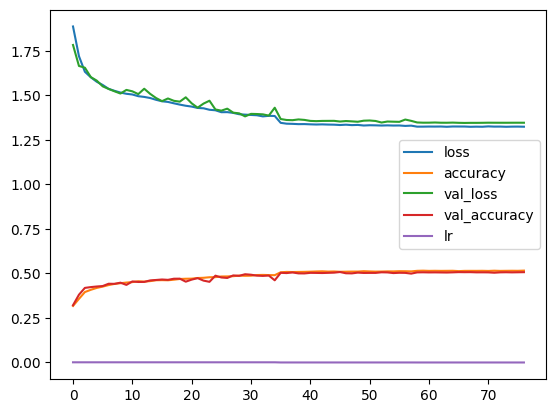

In [89]:
#5b. compile and train the FNN/MLP model

# set random state
tf.random.set_seed(1)

# compile the model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)

# train the model
history = model.fit(X_train_02, y_train, epochs=100,\
                    validation_data=(X_val_split, y_val_split), callbacks=[early_stopping, reduce_lr])

# visualize with plot
pd.DataFrame(history.history).plot();

In [90]:
#5c. predict and evaluate the FNN/MLP model performance

# make prediction
FNN_predict_prob = model.predict(X_val_02)  # predict probabilities for each class
FNN_predict = np.argmax(FNN_predict_prob, axis=1)  # obtain class labels by selecting the class with the highest probability

# calculate scores
FNN_accuracy = accuracy_score(y_val, FNN_predict)
FNN_f1 = f1_score(y_val, FNN_predict, average='weighted')

# print scores
print(f'Accuracy: {FNN_accuracy}, F1 Score: {FNN_f1}')
FNN_result = [FNN_accuracy, FNN_f1]

372/372 [==============================] - 1s 2ms/step
Accuracy: 0.5036625410457186, F1 Score: 0.467966089406811


<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        6.  Compile Results
    </i></strong>
</h2>

In [94]:
#6a. compare the results in df

# lists of models
model_results = [rf_result, xgb_result, catbst_result, stacked_result, FNN_result]

# create DataFrame
result_df = pd.DataFrame(model_results, columns=['Accuracy', 'F1 Score'], \
                         index=['rf', 'xgb', 'catbst', 'Stacked', 'MLP_FNN']).rename_axis('Model')

# sort by F1 Score
result_df = result_df.sort_values(by='F1 Score', ascending=False)
result_df

,Accuracy,F1 Score
Model,,
Stacked,0.547445,0.526162
catbst,0.540288,0.515813
xgb,0.540204,0.510222
rf,0.533552,0.498969
MLP_FNN,0.503663,0.467966


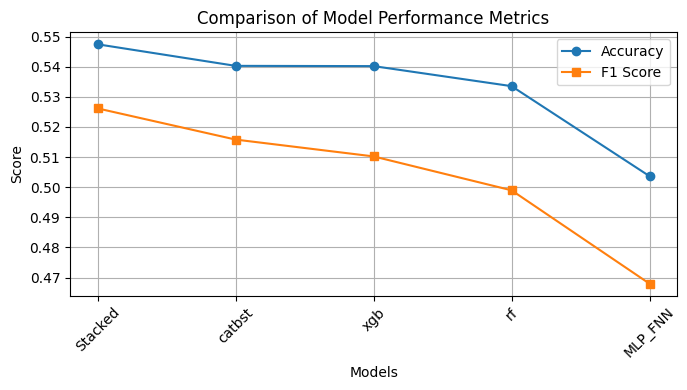

In [92]:
#6b. plot the comparison

plt.figure(figsize=(7, 4))
plt.plot(result_df.index, result_df['Accuracy'], marker='o', label='Accuracy')
plt.plot(result_df.index, result_df['F1 Score'], marker='s', label='F1 Score')

plt.title('Comparison of Model Performance Metrics')
plt.xlabel('Models')
plt.ylabel('Score')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()

<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Model Interpretation/Evaluation
</h2>

<h2 style='font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;'>
    <strong></i>
        1. Feature Importance Analysis
    </i></strong>
</h2>

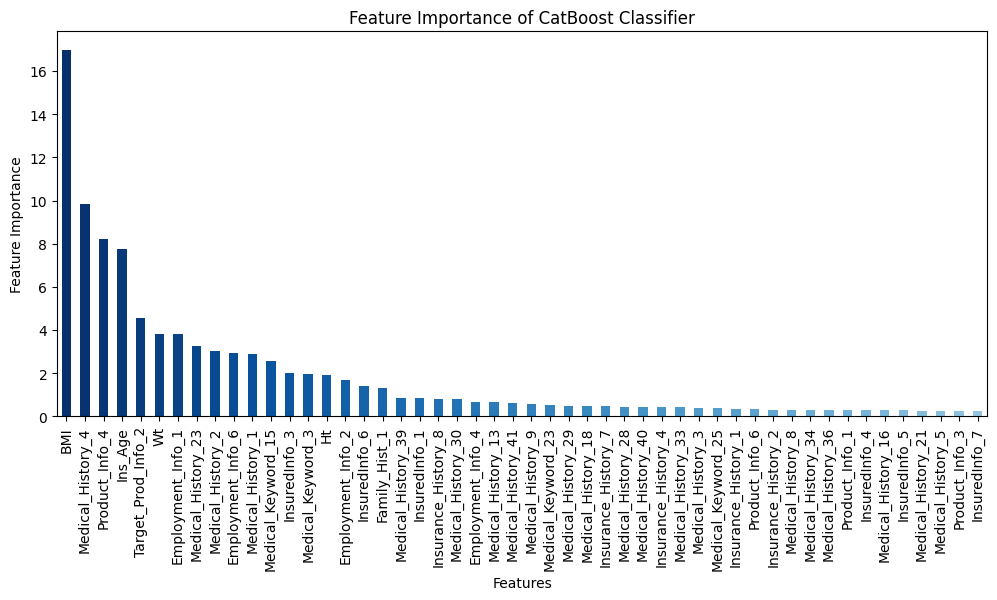

In [96]:
#1a. feature importance analysis of rf model base

# extract the feature importance of random forest classifier
ctbst_feature = pd.Series(catbst_tuned.feature_importances_, index=X_train_02.columns).sort_values(ascending=False)
ctbst_feature = ctbst_feature.head(50)

# plot the feature importance
plt.figure(1, figsize=(12,5))
color_map = plt.cm.Blues(np.linspace(1, 0.4, len(rf_feature)))
ctbst_feature.plot(kind='bar', color=color_map);  # Apply the color map to the bar plot
plt.xlabel('Features')
plt.ylabel('Feature Importance')
plt.title('Feature Importance of CatBoost Classifier')
plt.show()

<h2 style="font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;">
    <strong></i>
        2. Model Evaluation using Lift and Gain Analysis
        <a href='https://varshasaini.in/model-evaluation-using-lift-and-gain-analysis-lift-and-gain-charts/'> [ref] </a>
    </i></strong>
</h2>

   Decile  Cases  Responses  CumulativeResponses  %of_Events    Gain  lift
0       1   1188        487                  487       37.18   37.18  3.72
1       2   1188        268                  755       20.46   57.64  2.88
2       3   1187        166                  921       12.67   70.31  2.34
3       4   1188        118                 1039        9.01   79.32  1.98
4       5   1187         86                 1125        6.56   85.88  1.72
5       6   1188         58                 1183        4.43   90.31  1.51
6       7   1188         44                 1227        3.36   93.67  1.34
7       8   1187         29                 1256        2.21   95.88  1.20
8       9   1188         35                 1291        2.67   98.55  1.10
9      10   1188         19                 1310        1.45  100.00  1.00

In decile 1, the lift is 3.72:
this means that if we use the above random forest model then by selecting just 20% of the data,
we can find the actual Response of the multi cl

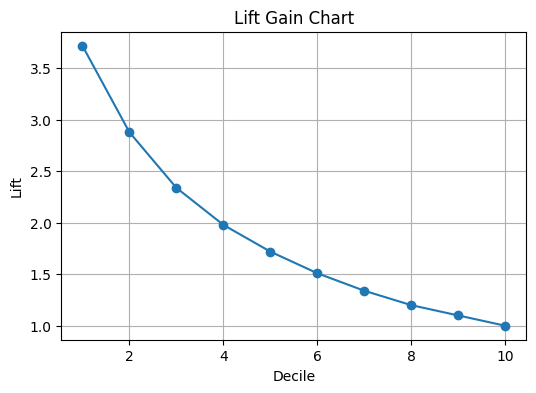

In [98]:
#2a. Lift and Gain Analysis of the stack model

# create a new DataFrame or add to X_test if you wish to keep everything together
X_val_with_prob = X_val_02.copy()

# predict probabilities with the original features used for training
X_val_with_prob['Prob'] = stacking_classifier.predict_proba(X_val_02[stacking_classifier.feature_names_in_])[:, 1]

# sort X_val_with_prob by 'Prob' and proceed with your analysis
X_val_with_prob = X_val_with_prob.sort_values(by='Prob', ascending=False)

# assign deciles
X_val_with_prob['Decile'] = pd.qcut(X_val_with_prob['Prob'], 10, labels=[i for i in range(10, 0, -1)])

# add your 'Response' column
X_val_with_prob['Response'] = y_val

# compute the number of responses in each decile
response = pd.crosstab(X_val_with_prob['Decile'], X_val_with_prob['Response'])[1].reset_index().rename(columns={1: 'Responses'})

# compute the number of cases in each decile
lift_gain = X_val_with_prob['Decile'].value_counts().reset_index().rename(columns={'count':'Cases'})

# merge to combine the responses with the total cases
lift_gain = pd.merge(lift_gain, response, on='Decile').sort_values(by='Decile', ascending=False).reset_index(drop=True)

# calculate the cumulative
lift_gain['CumulativeResponses'] = lift_gain['Responses'].cumsum()

# calculate the percentage of positive in each decile compared to the total number of responses
lift_gain['%of_Events'] = np.round(((lift_gain['Responses']/lift_gain['Responses'].sum())*100),2)

# calculate the Gain in each decile
lift_gain['Gain'] = lift_gain['%of_Events'].cumsum()

# convert Decile column to int
lift_gain['Decile']=lift_gain['Decile'].astype('int')

# calculate lift
lift_gain['lift']=np.round((lift_gain['Gain']/(lift_gain['Decile']*10)),2)

# display the resulting DataFrame
print(lift_gain)

# interpretation
print(f'\nIn decile {lift_gain.iloc[0,0]}, the lift is {lift_gain.iloc[0,-1]}:\n\
this means that if we use the above random forest model then by selecting just 20% of the data,\n\
we can find the actual Response of the multi class variable {lift_gain.iloc[0,-1]} times more than if we randomly select any model')

# Lift and Gain Charts
# Plot the lift gain chart
plt.figure(figsize=(6, 4))
plt.plot(lift_gain['Decile'], lift_gain['lift'], marker='o', linestyle='-')
plt.title('Lift Gain Chart')
plt.xlabel('Decile')
plt.ylabel('Lift')
plt.grid(True)

<h2 style="font-size: 20px; margin: 20px 0; border-bottom: 2px solid black; padding: 15px 0;">
    <strong></i>
        3. LIME Methodology
    </i></strong>
</h2>

In [100]:
#3a use lime to explain the best performing algorithm - rf_tuned

# initialize a LIME explainer
explainer = LimeTabularExplainer(training_data=np.array(X_train_02), feature_names=X_train_02.columns,
                                 class_names=[0,1,2,3,4,5,6,7], mode='classification')

# choose multiple instances to explain using the list below
instance_indices = [1, 5, 7, 12, 21]

# loop through each instance index
for instance_index in instance_indices:
    instance = X_val_02.iloc[instance_index] # get instances

    # generate LIME explanation for this instance
    exp = explainer.explain_instance(data_row=instance, 
                                     predict_fn=rf_tuned.predict_proba, # predict_proba for classification algorithm
                                     num_features=10)#len(X_train_02.columns)) # no. of features to include in the explanation

    # visualize the explanation
    exp.show_in_notebook(show_table=True, show_all=True)

<h2 
    align='center' 
    style='font-size: 40px; border-bottom: 2px solid black; border-top: 2px solid black; padding: 30px 0;'>
    Model Deployment
</h2>

In [ ]:
# merge the training and validation dataset
# retrain the model with the entire dataset
# save the model and data processing steps in pipeline
# load deploy model
# extract new data
# transform new data with the pipeline and predict